# RA Synovial tissue and blood - identify and export Tregs

Load libraries

In [1]:
suppressPackageStartupMessages({
#     library(ggthemes)
#     library(purrr)
#     library(glue)
#     library(furrr)
#     library(sfarrow)
    library(RColorBrewer)
    library(Seurat)
    library(dplyr)
    library(data.table)
    library(ggplot2)
    library(patchwork)
    library(harmony)
    library(entropy)
    library(presto)
    library(singlecellmethods)
    library(lme4)
    library(purrr)
    library(scDblFinder)
    library(BiocParallel)
    library(ggridges)
    library(ggthemes)
    library(cowplot)
#     library(Rcpp)
})
# knitr::opts_chunk$set(echo = FALSE)
# library(Seurat, warn.conflicts=FALSE)
# library(dplyr, warn.conflicts=FALSE)
# library(harmony, warn.conflicts=FALSE)
# library(symphony, warn.conflicts=FALSE)
# library(ggplot2, warn.conflicts=FALSE)
# library(RColorBrewer, warn.conflicts=FALSE)
# library(patchwork, warn.conflicts=FALSE)
# library(cowplot, warn.conflicts=FALSE)
# library(pheatmap, warn.conflicts=FALSE)
# library(ggpubr, warn.conflicts=FALSE)
# library(rstatix, warn.conflicts=FALSE)
# suppressMessages(library(scDblFinder))
# library(BiocParallel)
# library(ggridges)
# library(ggthemes)

# library(repr)

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}

Set variables

In [2]:
RNA_path <- "/data/brennerlab/AMP_Phase_2/Data/repertoire/gex/cellranger_output/"
# Rep_path <- "/data/brennerlab/AMP_Phase_2/Data/repertoire/repertoire/cellranger_output/"
SampMetaData_path <- "/data/brennerlab/Shani/projects/Treg_Tph/data/AMP_rep_dataset/TableS1_amp_ra_repertoire_patientInfo_4MetaData.csv"
SampMetaData2_path <- "/data/brennerlab/Shani/projects/Treg_Tph/data/AMP_rep_dataset/AMP_TCR_MetaData.csv"

save_path <- "/data/brennerlab/Shani/projects/Treg/analysis/AMPrep_syn_bl/"

Identify all samples for gene expression and repertoire

In [3]:
RNA_sampList <- list.files(path = RNA_path)
# Rep_sampList <- list.files(path = Rep_path, pattern = '_Syn_BT_T')
# sampList <- gsub("Sample_", "", RNA_sampList)
# sampList <- gsub("_Syn.*", "", sampList)
cat("RNA samples", RNA_sampList, sep="\n")

RNA samples
Sample_300_0150_PBL_BT_5
Sample_300_0150_Syn_BT_5
Sample_300_0171_PBL_BT_5
Sample_300_0171_PBL_BT_5_2
Sample_300_0171_Syn_BT_5
Sample_300_0173_PBL_BT_5
Sample_300_0173_Syn_BT_5
Sample_300_0174_PBL_BT_5
Sample_300_0174_Syn_BT_5
Sample_300_0392_PBL_BT_5
Sample_300_0392_Syn_BT_5
Sample_300_0410_PBL_BT_5
Sample_300_0410_Syn_BT_5
Sample_300_0414_PBL_BT_5
Sample_300_0414_Syn_BT_5
Sample_300_0415_Syn_BT_5
Sample_300_0416_Syn_BT_5
Sample_300_1883_Syn_BT_5
Sample_300_1930_PBL_BT_5
Sample_300_1930_Syn_BT_5
Sample_301_0174_PBL_BT_5
Sample_301_0174_Syn_BT_5
Sample_301_0174_Syn_PC_5
Sample_301_0270_PBL_BT_5
Sample_301_0270_Syn_BT_5


In [4]:
all.samples<- data.frame(RNA_sampList)
all.samples <- all.samples%>% mutate(samplePath = RNA_sampList)%>% tidyr::separate(col = RNA_sampList, sep = "_", into = c("a","b","c","tissue","ct","f","seq_repeat"))%>% tidyr::unite("donorID", c("b","c"))%>% 
    mutate(seq_repeat = ifelse(is.na(seq_repeat), 1, seq_repeat))%>% select(c(-a, -f)) %>% mutate(sampleName = gsub("Sample_", "", samplePath))
all.samples

Warning message:
“Expected 7 pieces. Missing pieces filled with `NA` in 24 rows [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, ...].”


donorID,tissue,ct,seq_repeat,samplePath,sampleName
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
300_0150,PBL,BT,1,Sample_300_0150_PBL_BT_5,300_0150_PBL_BT_5
300_0150,Syn,BT,1,Sample_300_0150_Syn_BT_5,300_0150_Syn_BT_5
300_0171,PBL,BT,1,Sample_300_0171_PBL_BT_5,300_0171_PBL_BT_5
300_0171,PBL,BT,2,Sample_300_0171_PBL_BT_5_2,300_0171_PBL_BT_5_2
300_0171,Syn,BT,1,Sample_300_0171_Syn_BT_5,300_0171_Syn_BT_5
300_0173,PBL,BT,1,Sample_300_0173_PBL_BT_5,300_0173_PBL_BT_5
300_0173,Syn,BT,1,Sample_300_0173_Syn_BT_5,300_0173_Syn_BT_5
300_0174,PBL,BT,1,Sample_300_0174_PBL_BT_5,300_0174_PBL_BT_5
300_0174,Syn,BT,1,Sample_300_0174_Syn_BT_5,300_0174_Syn_BT_5


## Build Seurat obj for single sample
Each "filtered_feature_bc_matrix.h5" file is located in the out/ directory within the sample directory (each sample is a batch)


### expression & protein data

In [5]:
gexData <- Seurat::Read10X_h5(paste(RNA_path, all.samples$samplePath[1], "/outs/filtered_feature_bc_matrix.h5", sep=''), use.names = T, unique.features = T)

Genome matrix has multiple modalities, returning a list of matrices for this genome



In [6]:
summary(gexData)

                 Length    Class     Mode
Gene Expression  169133221 dgCMatrix S4  
Antibody Capture     27726 dgCMatrix S4  

In [7]:
synRNA <- CreateSeuratObject(counts = gexData$`Gene Expression`,  project = all.samples$sampleName[1])
synRNA

An object of class Seurat 
36601 features across 4621 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data

In [8]:
#Add antibody
# create a new assay to store ADT information
adt_assay <- CreateAssayObject(counts = gexData$`Antibody Capture`, project = all.samples$sampleName[1])

# add this assay to the previously created Seurat object
synRNA[["ADT"]] <- adt_assay

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [9]:
synRNA

An object of class Seurat 
36607 features across 4621 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ADT

### metadata

In [10]:
SampMetaData <- read.csv(SampMetaData_path, header = T)
SampMetaData$AMP_ID <- gsub("-", "_", SampMetaData$AMP_ID)
head(SampMetaData)

,study_ID,AMP_ID,synovial_collection,blood_collection,method,tissue_location,age,sex,ethnicity,race,⋯,Prednisone_V0,TNFi_V0,DMARD_V0,bDMARD_V0,nbDMARD_V0,other_nbDMARD_V0,other_bDMARD_V0,seropositive,blood_cells_QC,synovial_cells_QC
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1,RA01,300_0150,Yes,Yes,Synovectomy,Wrist,28,Female,not_hispanic,white,⋯,Yes,No,No,No,No,No,No,Yes,4586,5188
2,RA02,300_0171,Yes,Yes,Synovectomy,MCP,72,Female,not_hispanic,white,⋯,No,No,Yes,No,Yes,No,No,Yes,3964,4123
3,RA03,300_0173,Yes,Yes,Synovectomy,Wrist,66,Female,not_hispanic,white,⋯,No,No,Yes,No,Yes,Yes,No,Yes,4648,1912
4,RA04,300_0174,Yes,Yes,Synovectomy,Wrist,80,Female,not_hispanic,white,⋯,No,Yes,Yes,Yes,Yes,Yes,No,Yes,4350,1302
5,RA05,300_0392,Yes,Yes,Biopsy,Knee,61,Female,hispanic_latino,white,⋯,No,Yes,Yes,Yes,Yes,No,No,Yes,3442,2823
6,RA06,300_0410,Yes,Yes,Biopsy,Knee,43,Female,hispanic_latino,asian_white,⋯,Yes,No,Yes,No,Yes,No,No,Yes,5625,4825


In [11]:
SampMetaData2 <- read.csv(SampMetaData2_path, header = T)
SampMetaData2$subject_id <- gsub("-", "_", SampMetaData2$subject_id)
head(SampMetaData2)

,subject_id,pipeline_date,site,treatment,biopsied,sex,age,CDAI,disease_duration,tissue_type,krenn_inflammation,single_cell_tech,cell_count_to_10x,mRNA_run,protein_run,atac_run
,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<int>,<dbl>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,300_0150,6/8/2019,University of Rochester,2,Wrist,Female,28,22.0,1.5,Synovectomy,2.67,CITEseq + flow/bulk + re-freeze,"15,000",BRI-403,BRI-404,BRI-449
2,300_0414,13/08/2019,UC San Diego,3,Knee,Female,65,36.7,0.1,Biopsy,0.33,CITEseq + flow/bulk + re-freeze,"15,000",BRI-427,BRI-428,BRI-450
3,300_0173,22/08/2019,Hospital for Special Surgery,1,Wrist,Female,66,10.5,1.8,Synovectomy,2.33,CITEseq + flow/bulk + re-freeze,"12,100",BRI-460,BRI-461,BRI-545
4,300_1930,22/08/2019,UK London,1,Knee,Female,68,28.3,0.0,Biopsy,2.33,CITEseq + flow/bulk + re-freeze,"13,500",BRI-462,BRI-463,BRI-546
5,300_0174,26/08/2019,Hospital for Special Surgery,3,Wrist,Female,80,21.0,23.2,Synovectomy,2.67,CITEseq + flow/bulk + re-freeze,"15,000",BRI-479,BRI-480,BRI-547
6,300_0392,16/09/2019,UC San Diego,3,Knee,Female,61,17.0,19.4,Biopsy,2.67,CITEseq + flow/bulk + re-freeze,15000,BRI-505,BRI-506,BRI-542


In [12]:
colList <- c('study_ID','AMP_ID','method','tissue_location','age','sex','ethnicity','race','RA_duration',
             'krenn_inflammation','cdai_V0','CTAP', 'pathotype', 'treatment_group')
allDonorMetadata <- SampMetaData %>% select(all_of(colList)) %>% as.data.frame() %>% 
                    left_join(., SampMetaData2%>% mutate(library = mRNA_run)%>% select(subject_id, site, library), by = join_by(AMP_ID == subject_id))

In [13]:
head(allDonorMetadata)

,study_ID,AMP_ID,method,tissue_location,age,sex,ethnicity,race,RA_duration,krenn_inflammation,cdai_V0,CTAP,pathotype,treatment_group,site,library
,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,22.0,M,Lymphoid,MTX failure,University of Rochester,BRI-403
2,RA02,300_0171,Synovectomy,MCP,72,Female,not_hispanic,white,40.931507,2.67,23.0,M,Lymphoid,MTX failure,Hospital for Special Surgery,BRI-556
3,RA03,300_0173,Synovectomy,Wrist,66,Female,not_hispanic,white,1.841096,2.33,10.5,F,Lymphoid,Naïve,Hospital for Special Surgery,BRI-460
4,RA04,300_0174,Synovectomy,Wrist,80,Female,not_hispanic,white,23.186301,2.67,21.0,E + F + M,No info,TNF failure,Hospital for Special Surgery,BRI-479
5,RA05,300_0392,Biopsy,Knee,61,Female,hispanic_latino,white,19.380822,2.67,17.0,T + B,Lymphoid,TNF failure,UC San Diego,BRI-505
6,RA06,300_0410,Biopsy,Knee,43,Female,hispanic_latino,asian_white,6.632877,2,64.0,T + F,Lymphoid,MTX failure,UC San Diego,BRI-583


In [14]:
donor.metadata <- allDonorMetadata[SampMetaData$AMP_ID == all.samples$donorID[1],] %>% lapply(rep, dim(gexData$`Gene Expression`)[2]) %>% as.data.frame() 
donor.metadata <- donor.metadata %>% mutate(sampleName = all.samples$sampleName[1]) %>% left_join(., all.samples %>% select(-samplePath), by = join_by(sampleName == sampleName)) 
rownames(donor.metadata) <- colnames(synRNA)
# donor.metadata$library <- ifelse(grepl("PBL", donor.metadata$tissue), paste0("PBL_", donor.metadata$library), donor.metadata$library)

head(donor.metadata)

rownames(donor.metadata)%>% length

,study_ID,AMP_ID,method,tissue_location,age,sex,ethnicity,race,RA_duration,krenn_inflammation,⋯,CTAP,pathotype,treatment_group,site,library,sampleName,donorID,tissue,ct,seq_repeat
,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCTGAGCTGATAA-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCAAGCCCAC-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCAAGCGTAG-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCACGCATCG-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCATCCGGGT-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCATTTCACT-1,RA01,300_0150,Synovectomy,Wrist,28,Female,not_hispanic,white,1.465753,2.67,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1


[1] 4621

In [15]:
synRNA <- AddMetaData(synRNA, donor.metadata)

In [16]:
head(synRNA@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,study_ID,AMP_ID,method,tissue_location,age,⋯,CTAP,pathotype,treatment_group,site,library,sampleName,donorID,tissue,ct,seq_repeat
,<fct>,<dbl>,<int>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCTGAGCTGATAA-1,300_0150_PBL_BT_5,4960,1642,1879,6,RA01,300_0150,Synovectomy,Wrist,28,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1
AAACCTGCAAGCCCAC-1,300_0150_PBL_BT_5,5564,1582,1403,5,RA01,300_0150,Synovectomy,Wrist,28,⋯,M,Lymphoid,MTX failure,University of Rochester,BRI-403,300_0150_PBL_BT_5,300_0150,PBL,BT,1


## Loop over all samples to add to obj.

In [17]:
Obj.list <- c()
for (i in seq(2,length(RNA_sampList))) {
    gexData <- suppressMessages(Read10X_h5(paste(RNA_path, all.samples$samplePath[i], "/outs/filtered_feature_bc_matrix.h5", sep=''), use.names = T, unique.features = T))
    tempRNA <- CreateSeuratObject(counts = gexData$`Gene Expression`,  project = all.samples$sampleName[i])
    adt_assay <- suppressWarnings(CreateAssayObject(counts = gexData$`Antibody Capture`,  project = all.samples$sampleName[i]))
    tempRNA[["ADT"]] <- adt_assay
    #add metadata
    donor.metadata <- allDonorMetadata[SampMetaData$AMP_ID == all.samples$donorID[i],] %>% lapply(rep, dim(gexData$`Gene Expression`)[2])  %>% as.data.frame() 
    donor.metadata <- donor.metadata %>% mutate(sampleName = all.samples$sampleName[i]) %>% left_join(., all.samples %>% select(-samplePath), by = join_by(sampleName == sampleName))        
    rownames(donor.metadata) <- colnames(tempRNA)
    # if (donor.metadata$tissue[1] == "PBL"){
    #     donor.metadata <- donor.metadata %>% mutate(library = paste0("PBL_", library))
    #     }
    tempRNA <- AddMetaData(tempRNA, donor.metadata)
    
    #add obj to list of objects
    Obj.list <- c(Obj.list, tempRNA)
}


In [18]:
synRNA <- merge(synRNA, y = Obj.list, add.cell.ids = all.samples$sampleName, project = "AMPrep")
synRNA

An object of class Seurat 
36607 features across 86415 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ADT

In [19]:
# remove large unnesesary files
rm(Obj.list, gexData, adt_assay, tempRNA)

In [20]:
# saveRDS(synRNA, paste0(save_path, "/AMPrep.allRaw.RNA.rds"))
# synRNA <- readRDS(paste0(save_path, "/raw.all.RNA.rds"))

## Basic  RNAseq QC

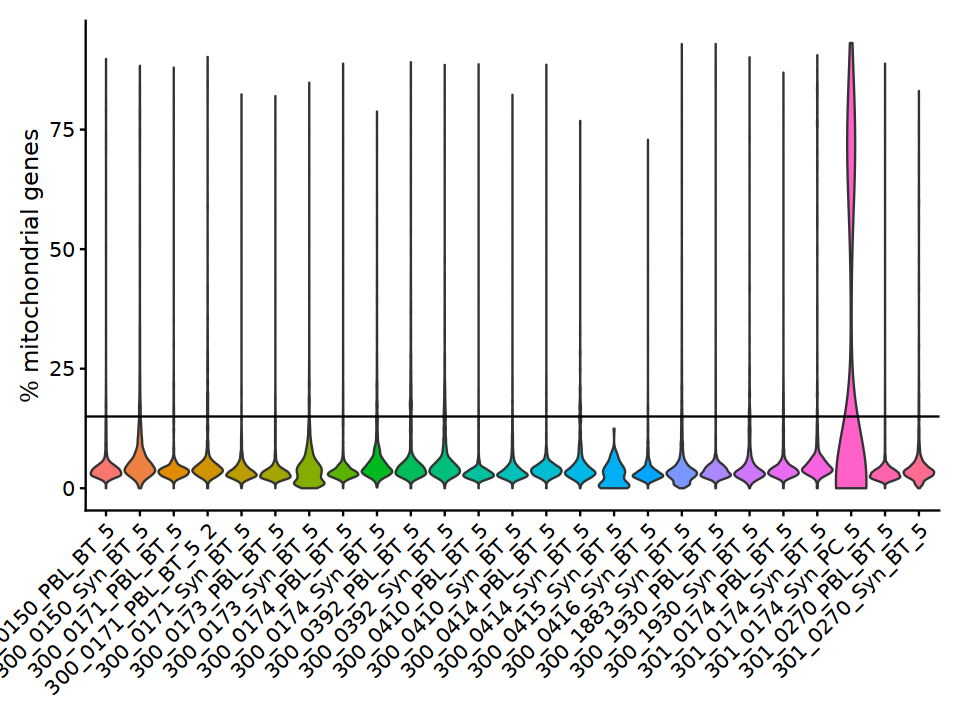

In [21]:
options(repr.plot.width=8, repr.plot.height=6)

#mito %
synRNA[["percent.mito"]] <- PercentageFeatureSet(synRNA, pattern = "^MT-")
VlnPlot(synRNA, features = "percent.mito", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("% mitochondrial genes") + geom_hline(yintercept=15)

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
“Removed 75322 rows containing non-finite values (`stat_ydensity()`).”


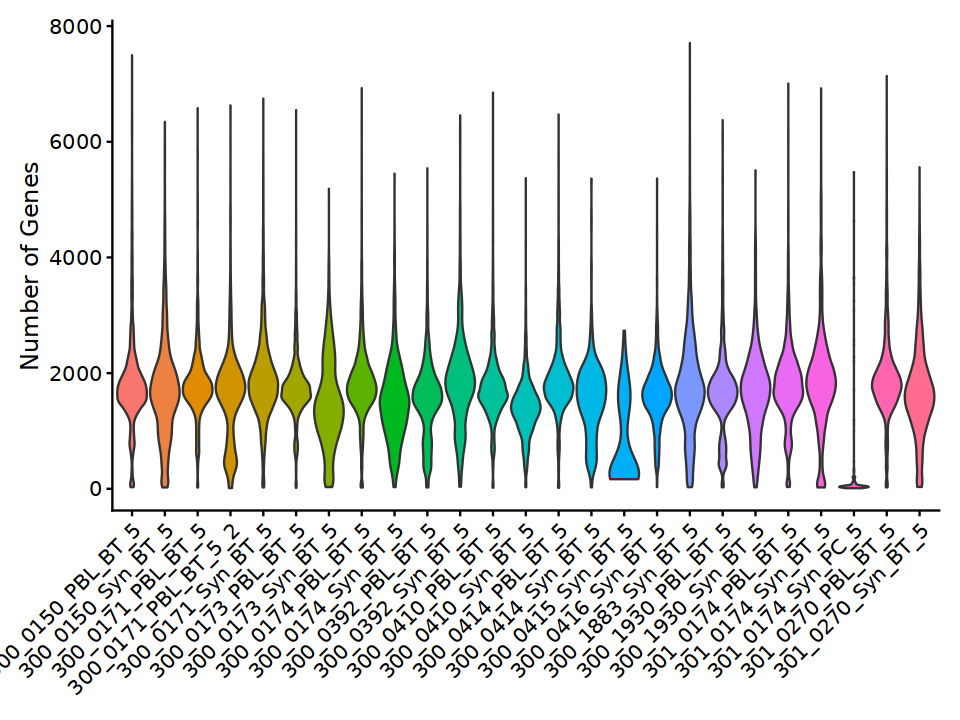

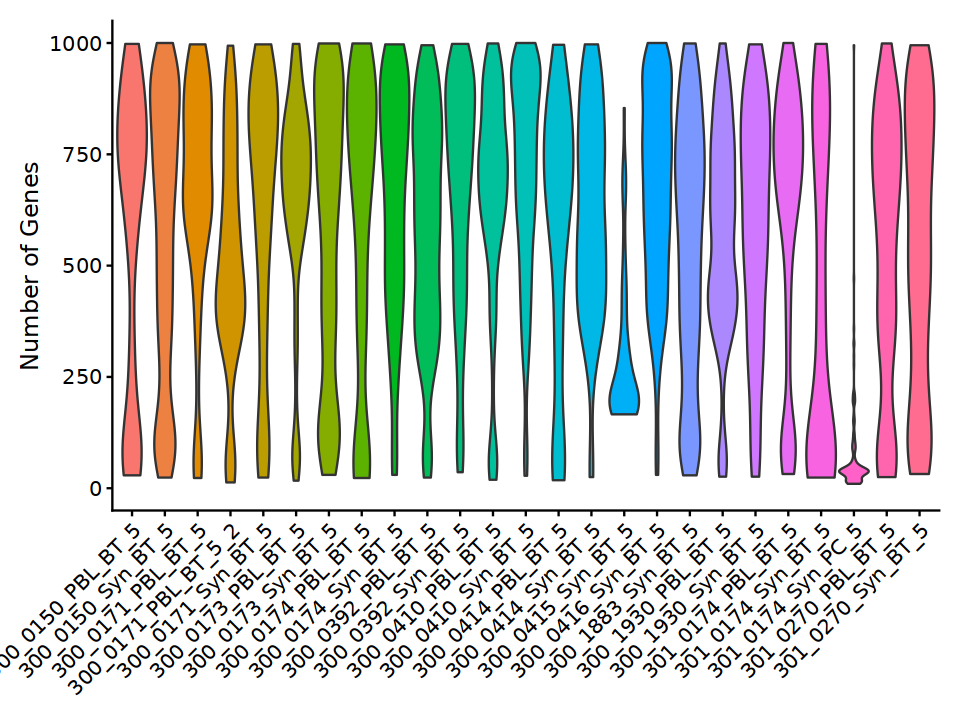

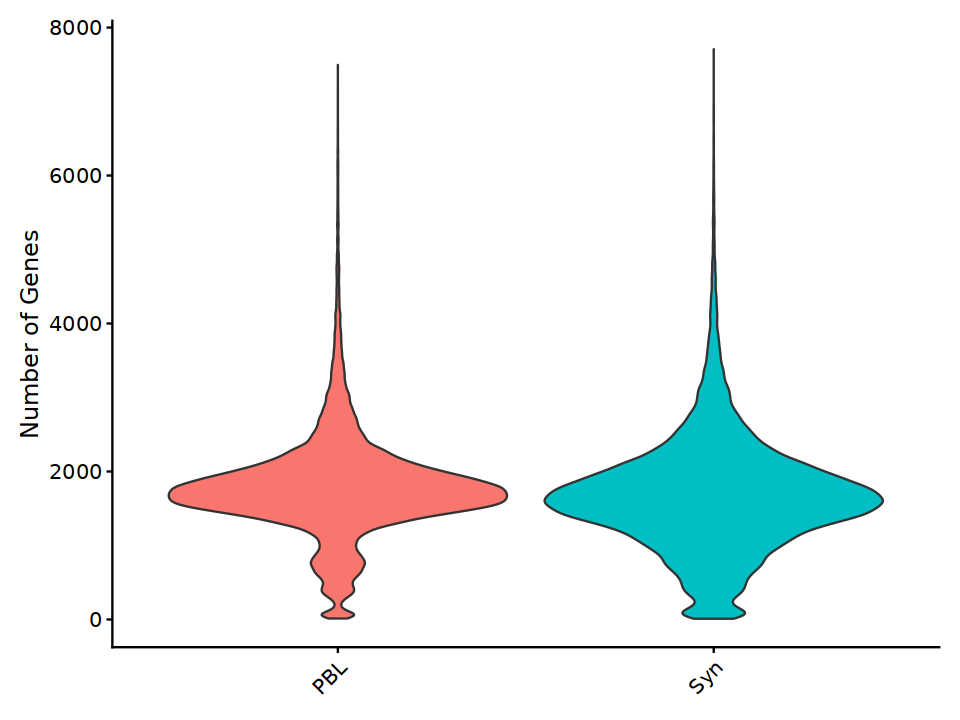

In [22]:
#Gene number
VlnPlot(synRNA, features = "nFeature_RNA", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Genes")
VlnPlot(synRNA, features = "nFeature_RNA", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Genes")+ ylim(0, 1000)
VlnPlot(synRNA, features = "nFeature_RNA", pt.size = 0.0, group.by = "tissue") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Genes") 

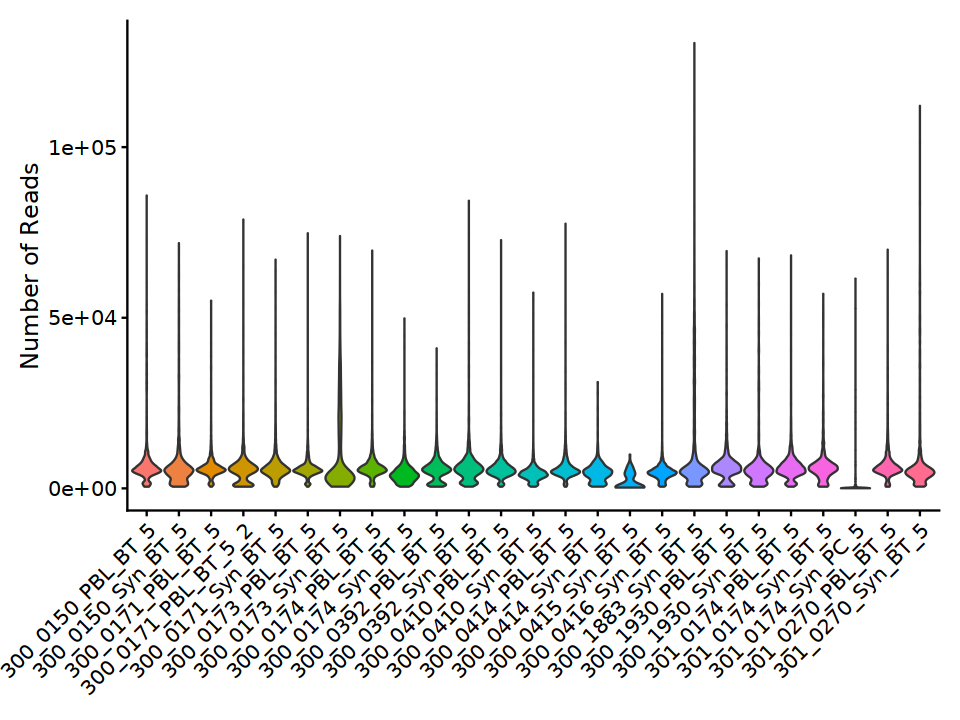

In [23]:
#reads number
VlnPlot(synRNA, features = "nCount_RNA", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Reads")

In [24]:
synRNA$orig.ident %>% unique()

[1] "300_0150_PBL_BT_5"   "300_0150_Syn_BT_5"   "300_0171_PBL_BT_5"  
 [4] "300_0171_PBL_BT_5_2" "300_0171_Syn_BT_5"   "300_0173_PBL_BT_5"  
 [7] "300_0173_Syn_BT_5"   "300_0174_PBL_BT_5"   "300_0174_Syn_BT_5"  
[10] "300_0392_PBL_BT_5"   "300_0392_Syn_BT_5"   "300_0410_PBL_BT_5"  
[13] "300_0410_Syn_BT_5"   "300_0414_PBL_BT_5"   "300_0414_Syn_BT_5"  
[16] "300_0415_Syn_BT_5"   "300_0416_Syn_BT_5"   "300_1883_Syn_BT_5"  
[19] "300_1930_PBL_BT_5"   "300_1930_Syn_BT_5"   "301_0174_PBL_BT_5"  
[22] "301_0174_Syn_BT_5"   "301_0174_Syn_PC_5"   "301_0270_PBL_BT_5"  
[25] "301_0270_Syn_BT_5"

#### Filtering cell quality and removing one bad sample
Removing two low quality samples

In [25]:
#removing sample 300_0415 
synRNA <- subset(synRNA, idents = c('301_0174_Syn_PC_5', '300_0415_Syn_BT_5'), invert = T)

Warning message:
“Removed 2154 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 75267 rows containing missing values (`geom_point()`).”


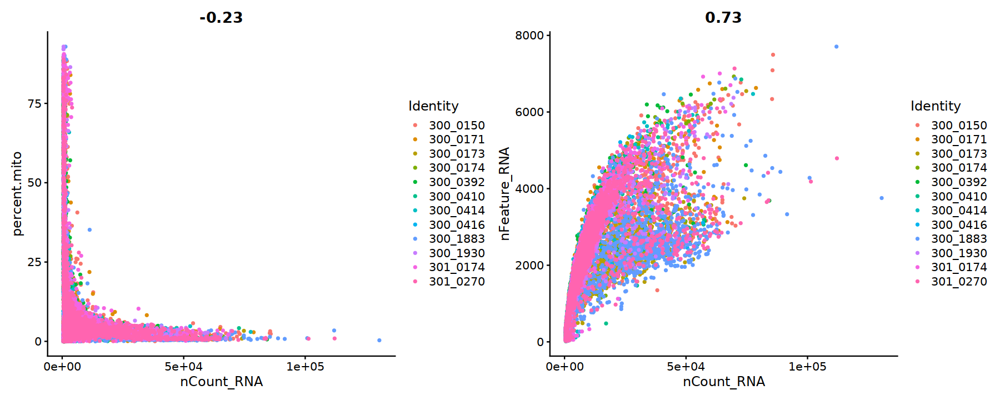

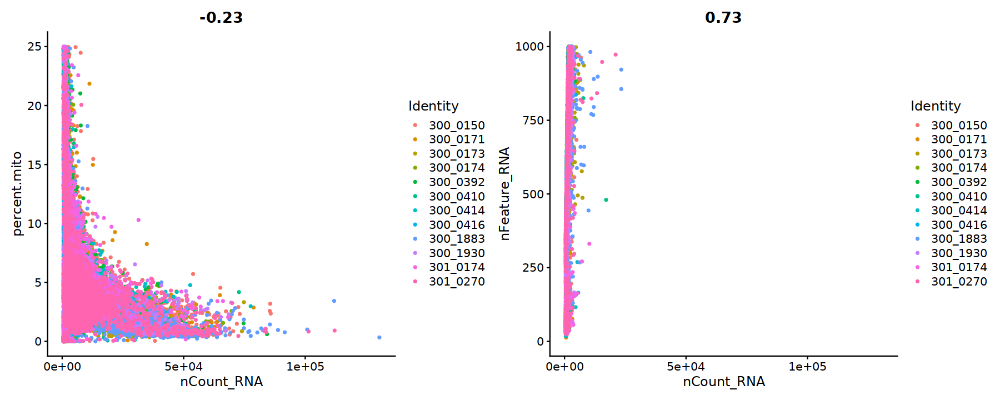

In [26]:
options(repr.plot.width = 15, repr.plot.height = 6)
plot1 <- FeatureScatter(synRNA, feature1 = "nCount_RNA", feature2 = "percent.mito", group.by = "AMP_ID")
plot2 <- FeatureScatter(synRNA, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "AMP_ID")
plot1 + plot2
plot1 <- FeatureScatter(synRNA, feature1 = "nCount_RNA", feature2 = "percent.mito", group.by = "AMP_ID") + ylim(0,25)
plot2 <- FeatureScatter(synRNA, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "AMP_ID") + ylim(0,1000)
plot1 + plot2

In [27]:
table(synRNA$orig.ident)
table(synRNA$donorID)
table(synRNA$tissue)


  300_0150_PBL_BT_5   300_0150_Syn_BT_5   300_0171_PBL_BT_5 300_0171_PBL_BT_5_2 
               4621                5703                2404                1886 
  300_0171_Syn_BT_5   300_0173_PBL_BT_5   300_0173_Syn_BT_5   300_0174_PBL_BT_5 
               4208                4726                2140                4460 
  300_0174_Syn_BT_5   300_0392_PBL_BT_5   300_0392_Syn_BT_5   300_0410_PBL_BT_5 
               1416                3882                3000                5730 
  300_0410_Syn_BT_5   300_0414_PBL_BT_5   300_0414_Syn_BT_5   300_0416_Syn_BT_5 
               5025                4461                 881                4466 
  300_1883_Syn_BT_5   300_1930_PBL_BT_5   300_1930_Syn_BT_5   301_0174_PBL_BT_5 
               4820                5687                1222                5999 
  301_0174_Syn_BT_5   301_0270_PBL_BT_5   301_0270_Syn_BT_5 
               1883                5192                2328 


300_0150 300_0171 300_0173 300_0174 300_0392 300_0410 300_0414 300_0416 
   10324     8498     6866     5876     6882    10755     5342     4466 
300_1883 300_1930 301_0174 301_0270 
    4820     6909     7882     7520 


  PBL   Syn 
49048 37092 

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: colour
ℹ This can happen when ggplot fails to infer the correct grouping structure in the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical variable into a factor?”


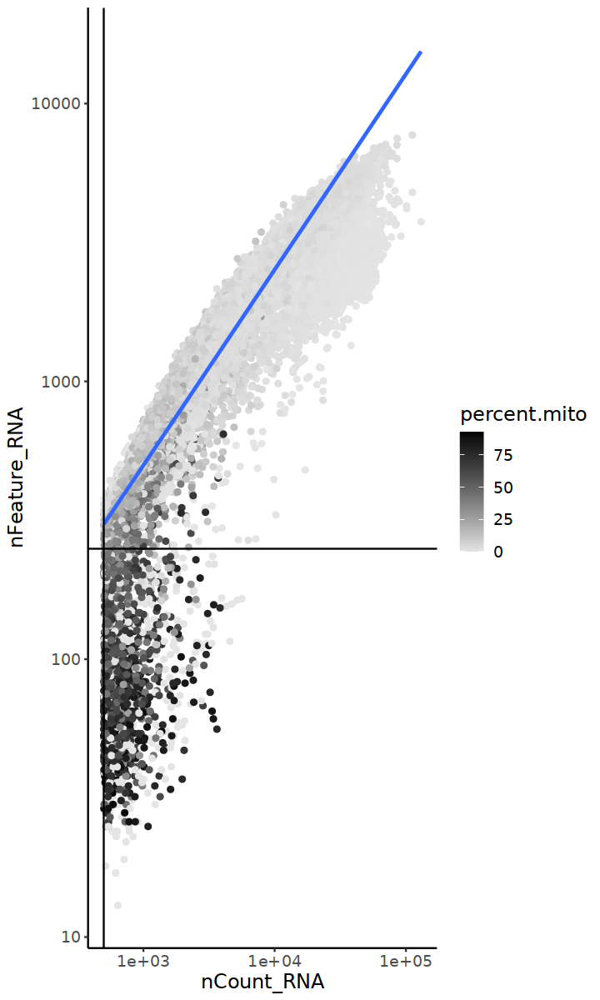

In [28]:
options(repr.plot.width = 6, repr.plot.height = 10)

synRNA@meta.data %>% 
  	ggplot(aes(x=nCount_RNA, y=nFeature_RNA, color=percent.mito)) + 
  	geom_point() + 
	scale_colour_gradient(low = "gray90", high = "black") +
  	stat_smooth(method=lm) +
  	scale_x_log10() + 
  	scale_y_log10() + 
  	theme_classic() +
  	geom_vline(xintercept = 500) +
  	geom_hline(yintercept = 250) +
    theme(text = element_text(size = 14)) 

In [29]:
#filtering
synRNA <- subset(synRNA, subset = nCount_RNA > 500 & nFeature_RNA > 250 &  percent.mito < 20)
# AMP phase 2 parameters
# synRNA <- subset(synRNA, subset = nFeature_RNA > 400 & percent.mito < 20)


In [30]:
synRNA

An object of class Seurat 
36607 features across 82802 samples within 2 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 layers present: counts, data
 1 other assay present: ADT

### Normalization & Harmony & Dimentional reduction

In [31]:
#initial dimensionality reduction on all samples to identify contaminating clusters
synRNA <- NormalizeData(synRNA, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)


Centering and scaling data matrix



In [32]:
synRNA <- NormalizeData(synRNA, assay = "ADT", normalization.method = "CLR", margin = 2) %>% 
    ScaleData(assay = "ADT")

Normalizing across cells

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony converged after 4 iterations



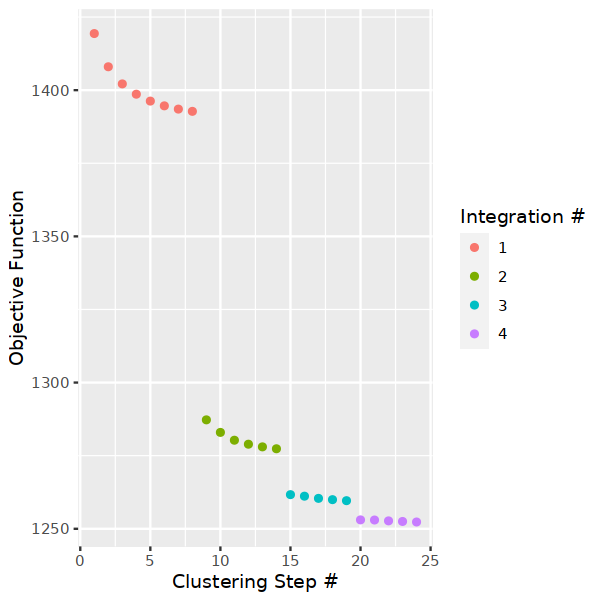

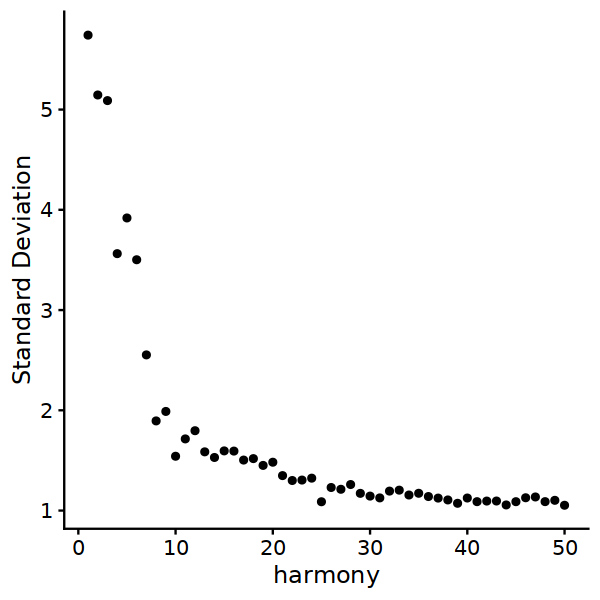

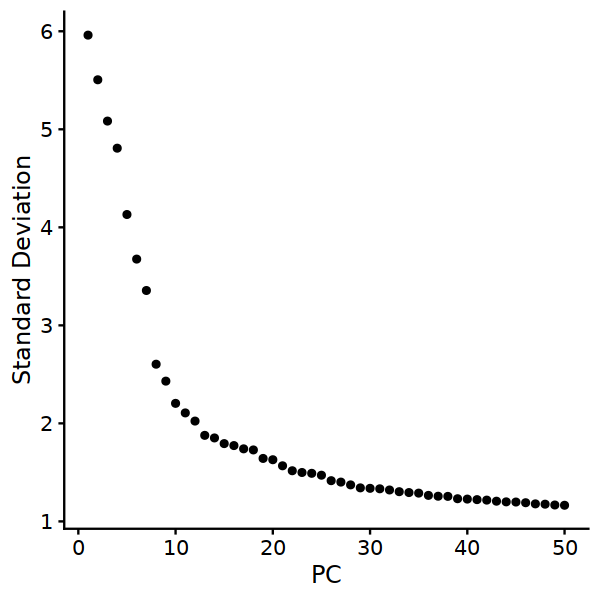

In [33]:
fig.size(5,5)
synRNA <- RunHarmony(synRNA, group.by.vars=c("orig.ident", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

ElbowPlot(synRNA, ndims = 50, reduction = "harmony") 
ElbowPlot(synRNA, ndims = 50, reduction = "pca") 

In [34]:
set.seed(1)
HU <- uwot::umap(synRNA@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(synRNA)
synRNA[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(synRNA)
synRNA[['humap_fgraph']] <- HU_graph

synRNA <- FindClusters(synRNA, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)


Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 82802
Number of edges: 997716

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8210
Number of communities: 24
Elapsed time: 10 seconds


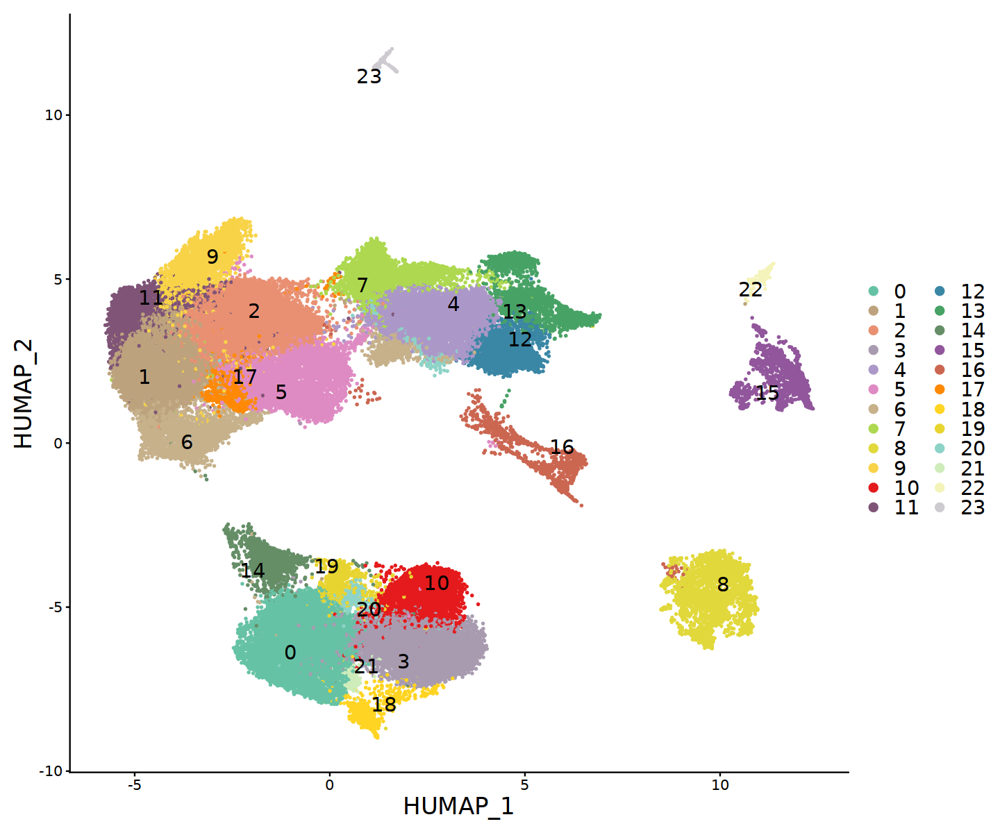

In [35]:
fig.size(10,12)

clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:10])

DimPlot(synRNA, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_manual(values = clustercols) + theme(text = element_text(size = 20))



Warning message:
“ggrepel: 12 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


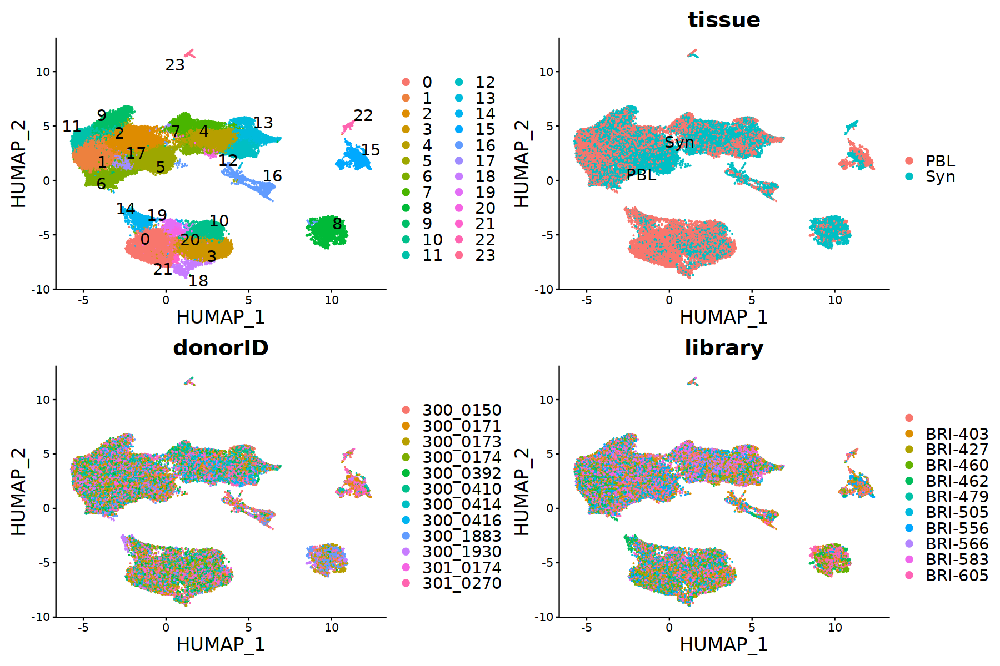

In [36]:
fig.size(10, 15)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

p1 <- DimPlot(synRNA, label = T, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p2 <- DimPlot(synRNA, group.by = "tissue", label = T, repel = T, shuffle = T, label.size = 6) + theme(text = element_text(size = 20))
p3 <- DimPlot(synRNA, group.by = "donorID", label = F, repel = T, shuffle = T,label.size = 6) + theme(text = element_text(size = 20))
p4 <- DimPlot(synRNA, group.by = "library", label = F, repel = T, shuffle = T,label.size = 6) + theme(text = element_text(size = 20))

p1+p2+p3+p4+ plot_layout(ncol = 2)

### Find and remove doublets 

Using - https://plger.github.io/scDblFinder/index.html

In [37]:
sce <- as.SingleCellExperiment(synRNA)
bp <- MulticoreParam(3, RNGseed=1234)
sce <- scDblFinder(sce, clusters="seurat_clusters", samples = "orig.ident", BPPARAM=bp)

R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call


R_zmq_msg_send errno: 4 strerror: Interrupted system call




In [38]:
a <- table(sce$scDblFinder.class)
a
a[2]/(a[1]+a[2])



singlet doublet 
  77139    5663 

doublet 
0.06839207

Picking joint bandwidth of 0.0215

Picking joint bandwidth of 0.0351



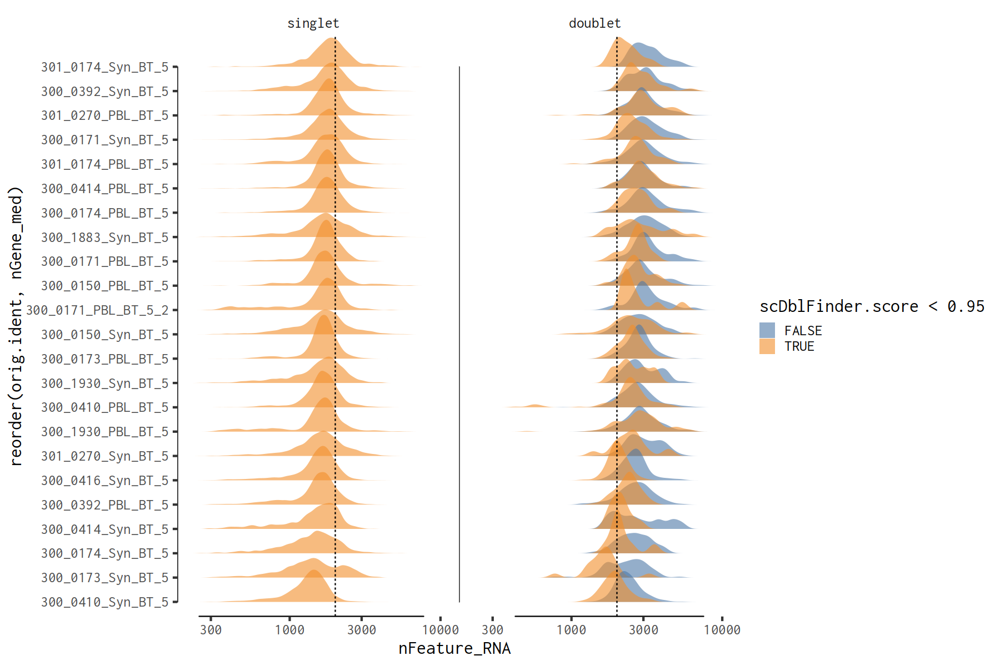

In [39]:
data.frame(sce@colData) %>% filter(!is.na(scDblFinder.class)) %>% group_by(orig.ident,) %>% 
mutate(nGene_med = median(nFeature_RNA)) %>% 
    ggplot(aes(nFeature_RNA, reorder(orig.ident, nGene_med), fill = scDblFinder.score<0.95)) + 
        geom_density_ridges2(alpha = .6, color = NA) + 
        theme_tufte(base_size = 20) + geom_rangeframe(color = 'black') + 
        scale_x_continuous(trans = 'log10') + geom_vline(xintercept = 2000, linetype =2) +
        scale_fill_tableau() +  facet_wrap(~scDblFinder.class, ncol = 2) + 

        NULL

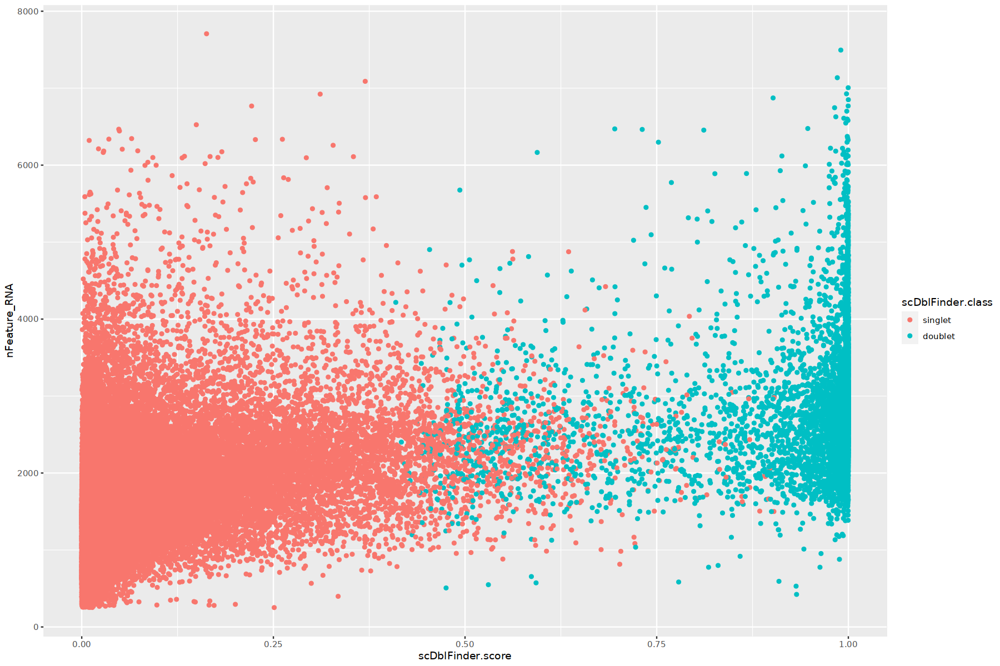

In [40]:
sce@colData %>% data.frame %>% ggplot(aes(x=scDblFinder.score, y=nFeature_RNA, color=scDblFinder.class)) + geom_point()

In [41]:
synRNA$scDblFinder.class <- sce$scDblFinder.class
synRNA$scDblFinder.score <- sce$scDblFinder.score

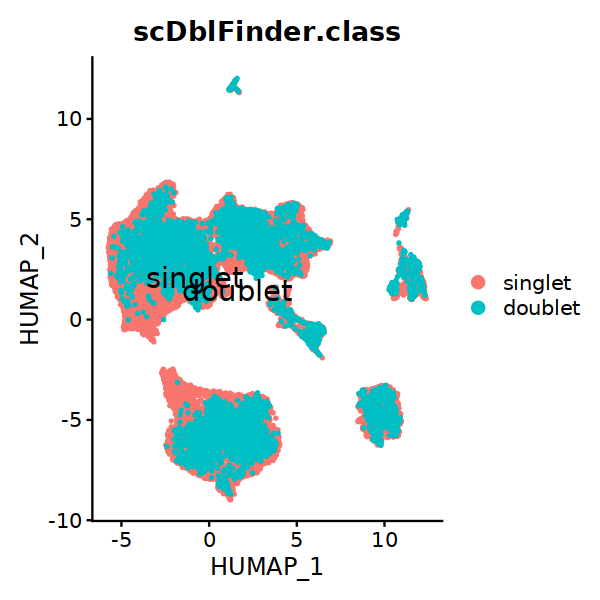

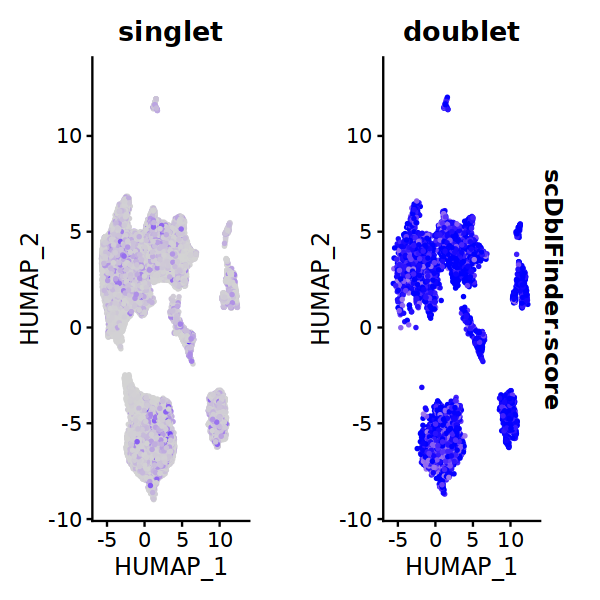

In [42]:
fig.size(5,5)
DimPlot(synRNA, label = T, pt.size = 0.5, label.size = 6, order =  c("doublet", "singlet"), group.by = "scDblFinder.class") 
FeaturePlot(synRNA, pt.size = 0.5, label.size = 6, repel = T, split.by = "scDblFinder.class", features = "scDblFinder.score") 

#### remove doublets

In [43]:
synRNA <- subset(synRNA, subset = scDblFinder.class == "singlet")

### Remove non T cells

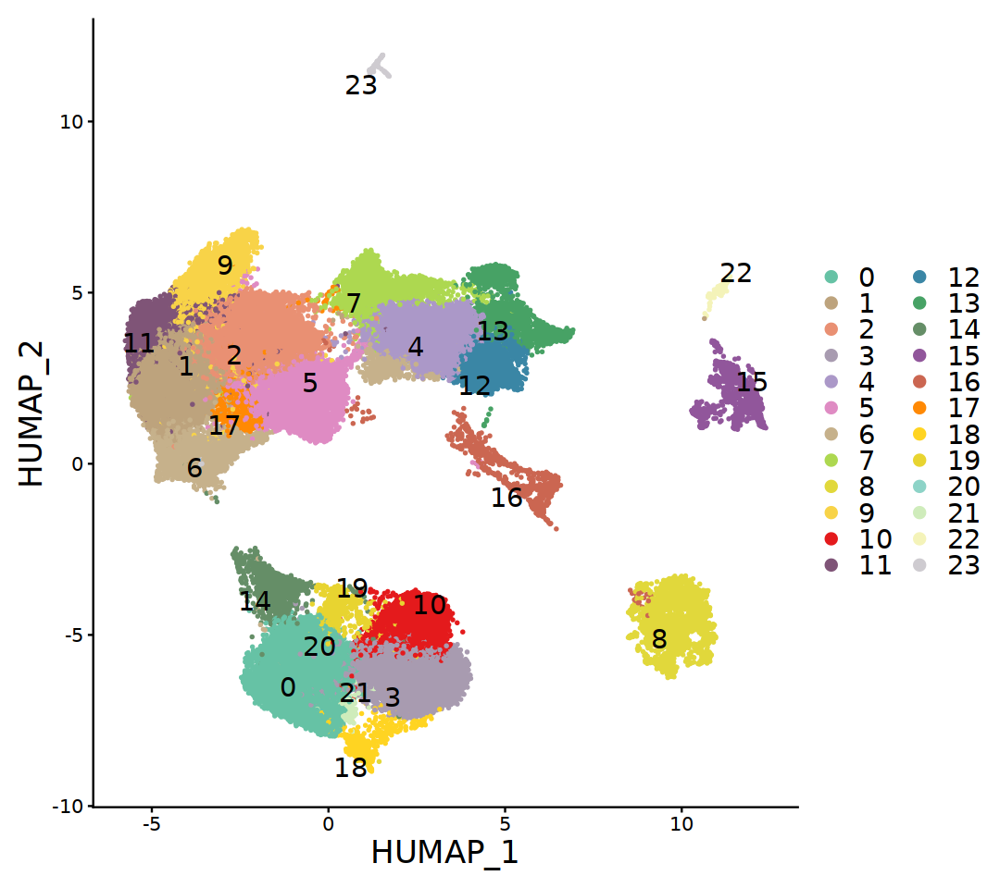

In [44]:
fig.size(8,9)

DimPlot(synRNA, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_manual(values = clustercols) + theme(text = element_text(size = 20))

In [45]:
synRNA <- NormalizeData(synRNA, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)


synRNA <- NormalizeData(synRNA, assay = "ADT", normalization.method = "CLR", margin = 2) %>% 
    ScaleData(assay = "ADT")

Centering and scaling data matrix

Normalizing across cells

Centering and scaling data matrix



Warning message:
“Could not find CD27-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD8a-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD4-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD20-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find IgD-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD11c-TotalA in the default search locations, found in ‘ADT’ assay instead”


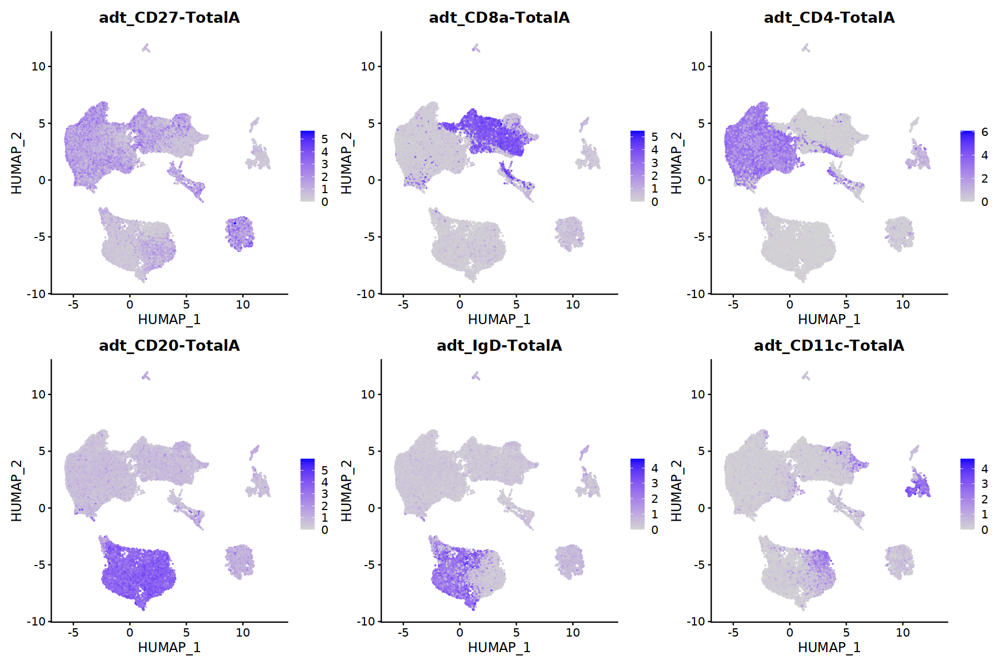

In [46]:
fig.size(10,15)

FeaturePlot(synRNA, features = rownames(synRNA@assays$ADT), ncol = 3) #+

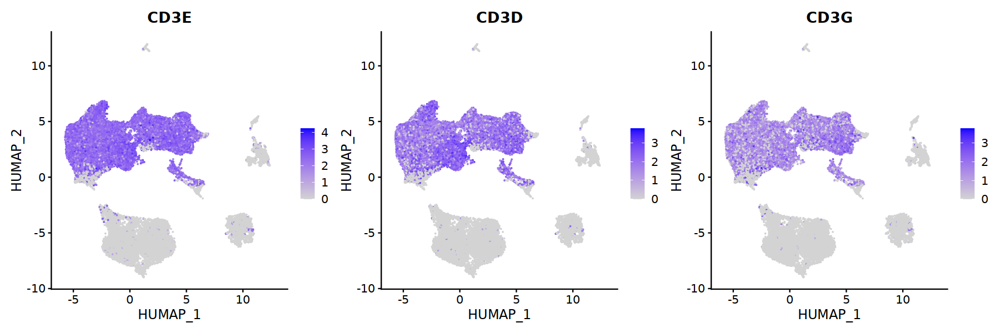

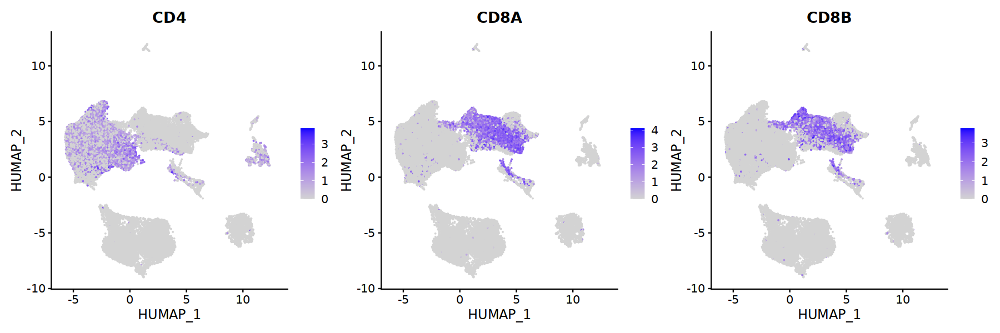

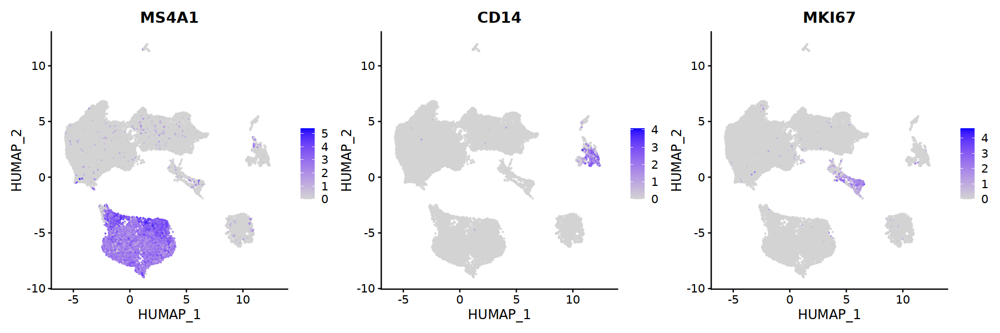

In [47]:
fig.size(5,15)
CD.list <- rownames(synRNA)[grepl("^CD", rownames(synRNA))]
FeaturePlot(synRNA, features = c("CD3E", "CD3D", "CD3G"), ncol = 3)
FeaturePlot(synRNA, features = c("CD4", "CD8A", "CD8B"), ncol = 3)
FeaturePlot(synRNA, features = c('MS4A1', 'CD14', 'MKI67'), ncol = 3)

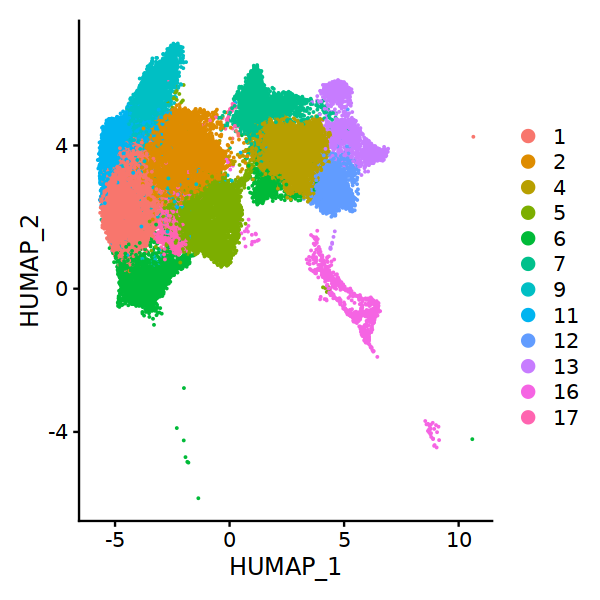

In [48]:
fig.size(5,5)
# T.clusters <- c(0,1,2,6,7,8,10,11,13,16,18,20,21)
T.clusters <- c(1,2,4,5,6,7,9,11,12,13,16,17)

DimPlot(synRNA, cells = rownames(synRNA@meta.data)[synRNA$seurat_clusters %in% T.clusters])

In [49]:
#keeping T cells only
synRNA.allT <- subset(synRNA, idents = T.clusters)

## Fresh T cell preproccessing

In [50]:
synRNA.allT <- DietSeurat(synRNA.allT, scale.data = FALSE, dimreducs = NULL)
synRNA.allT$`humap_fgraph_res.1` <- NULL

In [51]:
synRNA.allT <- NormalizeData(synRNA.allT, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)

Centering and scaling data matrix



In [52]:
synRNA.allT <- NormalizeData(synRNA.allT, assay = "ADT", normalization.method = "CLR", margin = 2) %>% 
    ScaleData(assay = "ADT")

Normalizing across cells

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



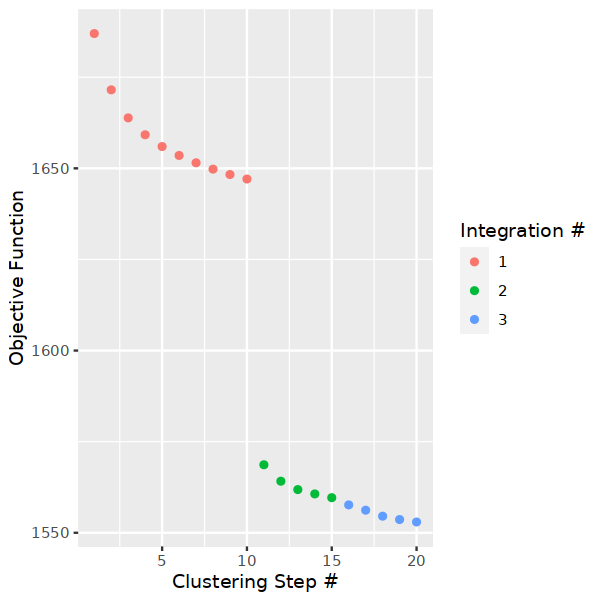

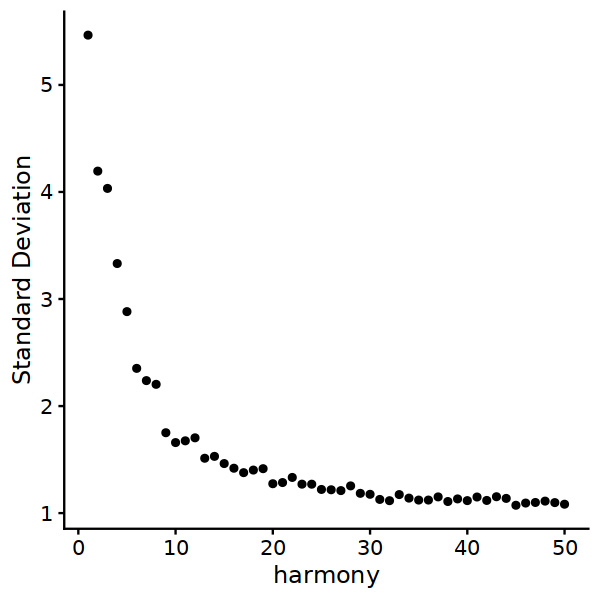

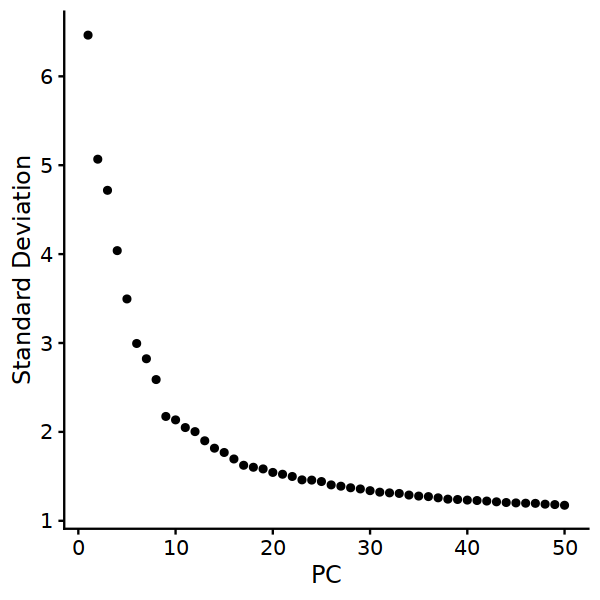

In [53]:
fig.size(5,5)
synRNA.allT <- RunHarmony(synRNA.allT, group.by.vars=c("orig.ident", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

ElbowPlot(synRNA.allT, ndims = 50, reduction = "harmony") 
ElbowPlot(synRNA.allT, ndims = 50, reduction = "pca") 

In [54]:
set.seed(1)
HU <- uwot::umap(synRNA.allT@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(synRNA.allT)
synRNA.allT[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(synRNA.allT)
synRNA.allT[['humap_fgraph']] <- HU_graph

synRNA.allT <- FindClusters(synRNA.allT, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 49002
Number of edges: 604165

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7672
Number of communities: 18
Elapsed time: 4 seconds


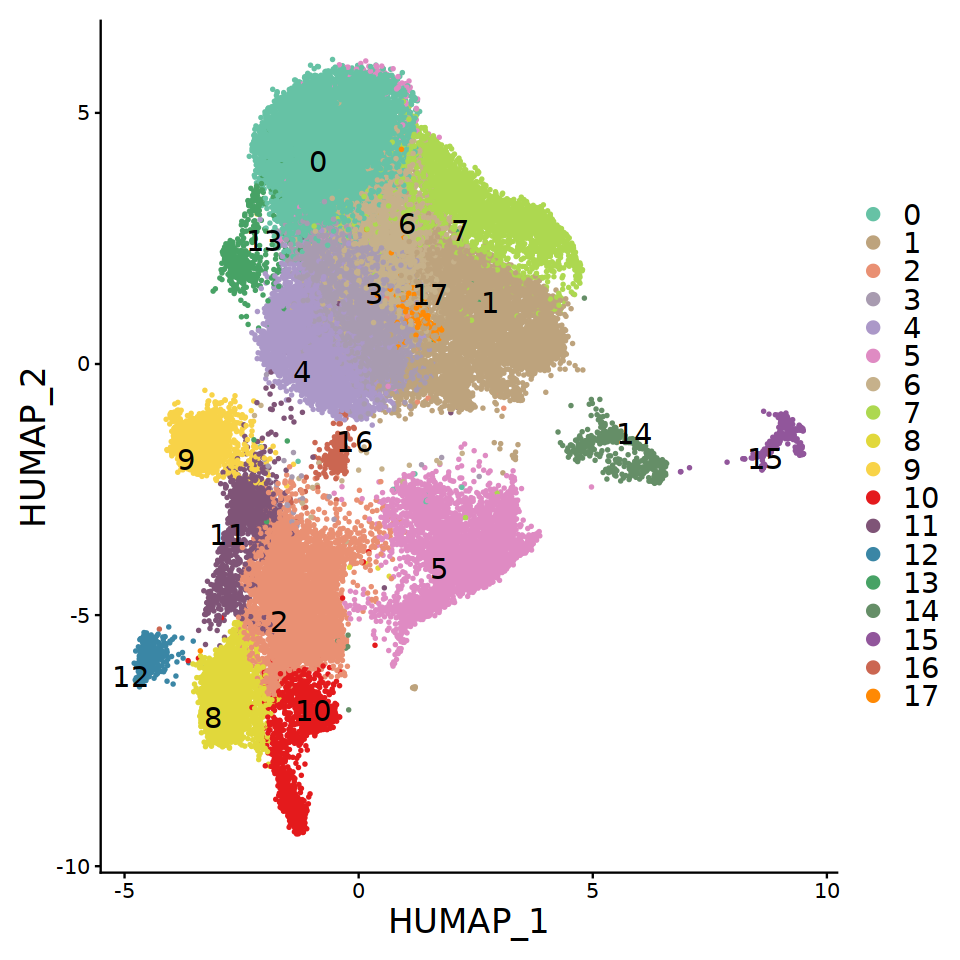

In [55]:
fig.size(8,8)

DimPlot(synRNA.allT, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_manual(values = clustercols) + theme(text = element_text(size = 20))

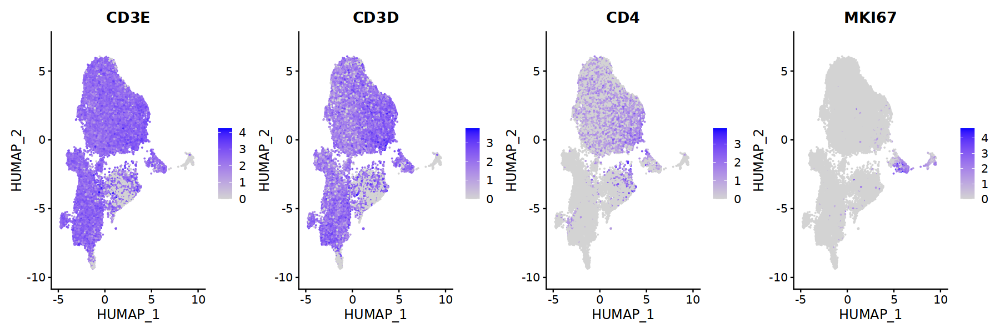

In [61]:
fig.size(5,15)

FeaturePlot(synRNA.allT, features = c("CD3E", "CD3D", "CD4", "MKI67"), ncol = 4)


Warning message:
“Could not find CD27-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD8a-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD4-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD20-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find IgD-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD11c-TotalA in the default search locations, found in ‘ADT’ assay instead”


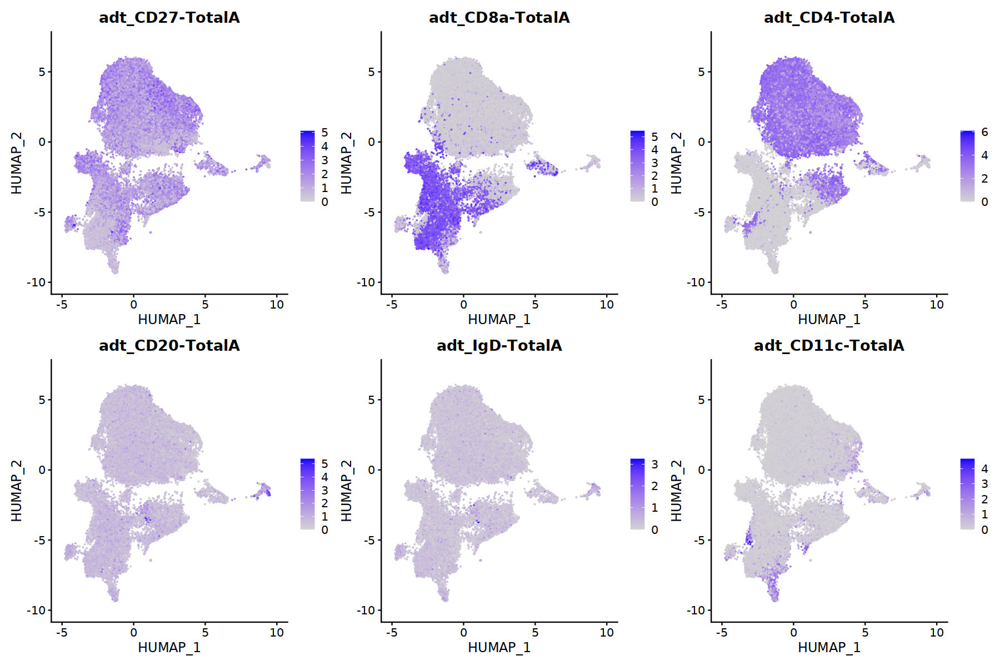

In [62]:
options(repr.plot.width=15, repr.plot.height=10)
FeaturePlot(synRNA.allT, features = rownames(synRNA@assays$ADT), ncol = 3) #+

The default behaviour of split.by has changed.
Separate violin plots are now plotted side-by-side.
To restore the old behaviour of a single split violin,
set split.plot = TRUE.
      
This message will be shown once per session.



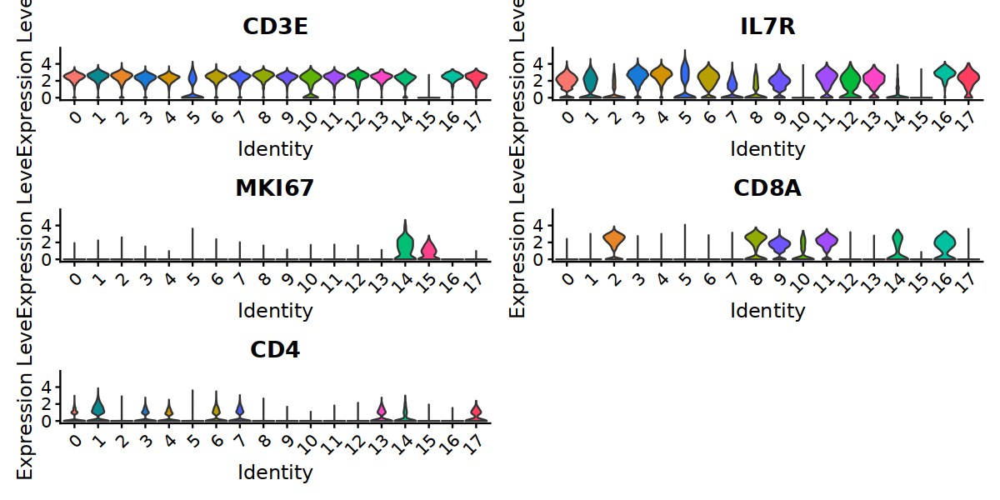

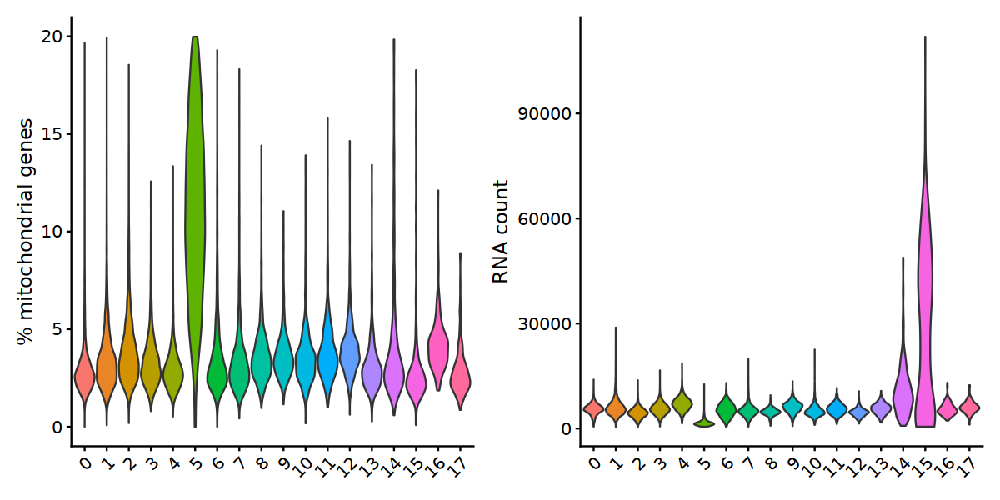

In [63]:
fig.size(5, 10)
VlnPlot(object = synRNA.allT, features = c('CD3E', 'IL7R','MKI67', 'CD8A', 'CD4'),
        split.by = 'seurat_clusters', ncol = 2, same.y.lims = T, pt.size = 0)

synRNA.allT[["percent.mito"]] <- PercentageFeatureSet(synRNA.allT, pattern = "^MT-")
a <- VlnPlot(synRNA.allT, features = "percent.mito", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("% mitochondrial genes")
b <- VlnPlot(synRNA.allT, features = "nCount_RNA", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("RNA count")
a|b

In [64]:
#save full Tcells 
saveRDS(synRNA.allT, paste0(save_path, "/AMPrep.all.T.RNA.rds"))

## Removing all clusters that are not CD4 T cells

Warning message in check_pal_n(n, max_n):
“This palette can handle a maximum of 20 values.You have supplied 21.”
Warning message:
“Removed 1767 rows containing missing values (`geom_point()`).”


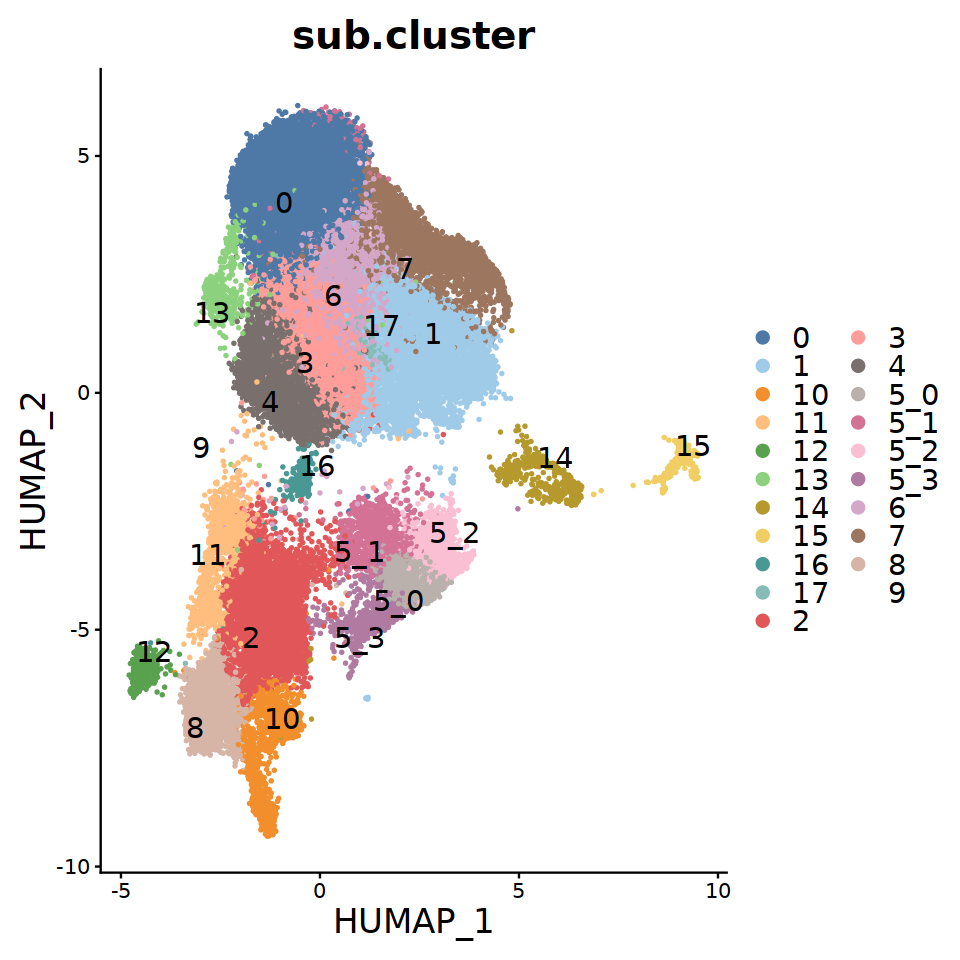

In [66]:
Idents(synRNA.allT) <- "seurat_clusters"
synRNA.allT <- FindSubCluster(synRNA.allT, cluster = 5, resolution = 0.3, graph.name = "humap_fgraph")


fig.size(8,8)
DimPlot(synRNA.allT, group.by = "sub.cluster", label = T, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + 
    theme(text = element_text(size = 20)) +
    scale_color_tableau("Tableau 20")

Warning message:
“Removed 1 rows containing non-finite values (`stat_ydensity()`).”


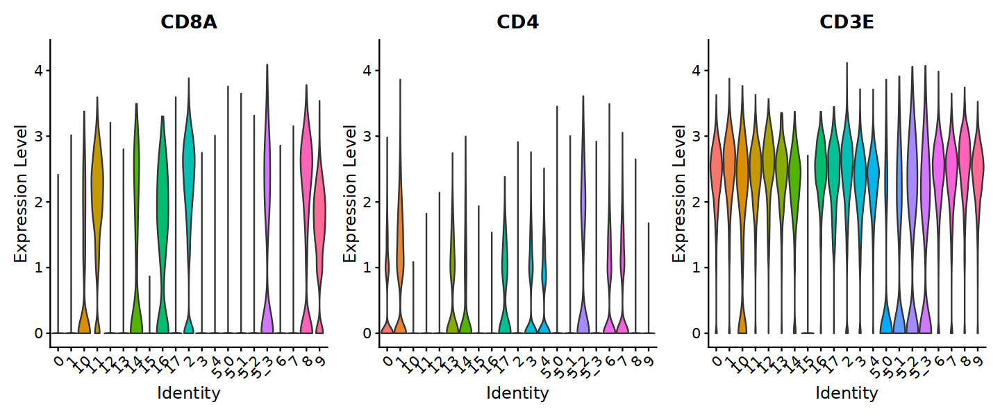

In [72]:
fig.size(5,12)
VlnPlot(object = synRNA.allT, features = c('CD8A', 'CD4', 'CD3E'),
        group.by = 'sub.cluster', ncol = 3, same.y.lims = T, pt.size = 0)


In [74]:
options(repr.plot.width=7, repr.plot.height=7)
Idents(synRNA.allT) <- "sub.cluster"
synRNA.T4 <- subset(synRNA.allT, idents = c(0,1,3,4,6,7,13,14,17, "5_2")) #c(0, 1, 4, 5, 6, 7, 10, 15, 18, 19, 20))

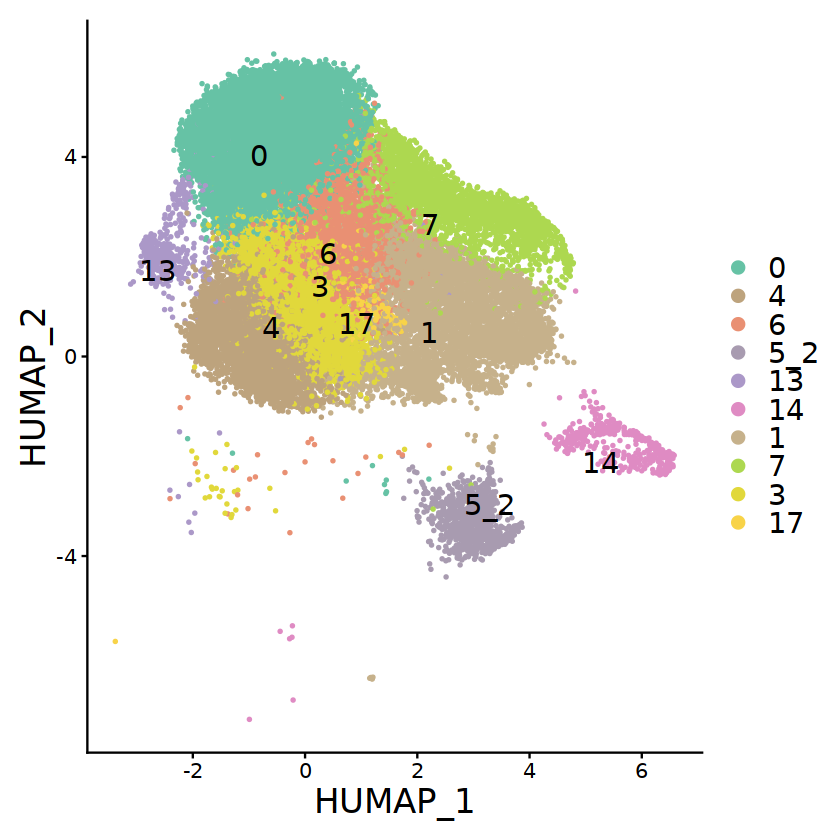

In [75]:
DimPlot(synRNA.T4, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_manual(values = clustercols) + theme(text = element_text(size = 20))

Warning message:
“Could not find CD4-TotalA in the default search locations, found in ‘ADT’ assay instead”
Warning message:
“Could not find CD8a-TotalA in the default search locations, found in ‘ADT’ assay instead”


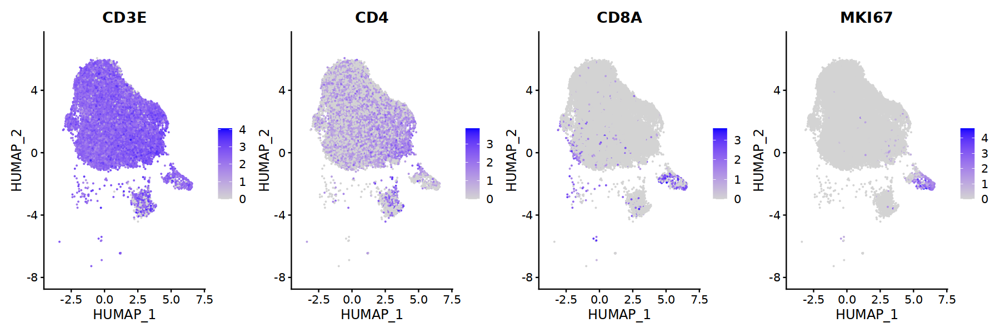

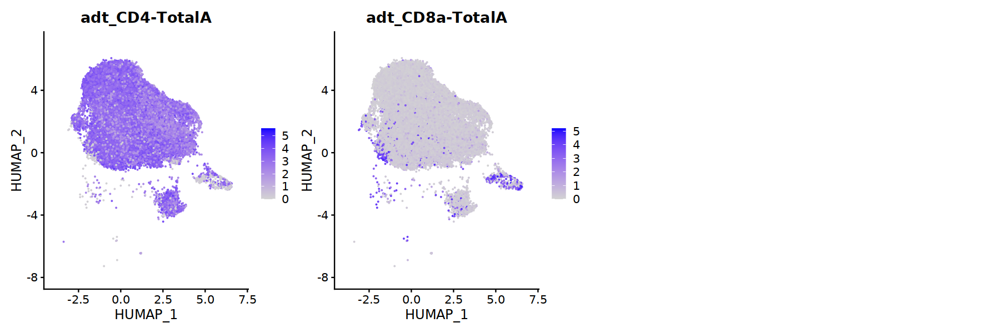

In [76]:
options(repr.plot.width=15, repr.plot.height=5)

CD.list <- rownames(synRNA.T4)[grepl("^CD", rownames(synRNA.T4))]
FeaturePlot(synRNA.T4, features = c("CD3E", "CD4", "CD8A", "MKI67"), ncol = 4)
FeaturePlot(synRNA.T4, features = c("CD4-TotalA", "CD8a-TotalA"), ncol = 4)


In [77]:
#synRNA.T4 <- subset(synRNA.T4, idents = c(7), invert = T)
synRNA.T4

An object of class Seurat 
36607 features across 33041 samples within 2 assays 
Active assay: RNA (36601 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, harmony, humap

In [78]:
synRNA.T4 <- DietSeurat(synRNA.T4, scale.data = FALSE, dimreducs = NULL)
synRNA.T4$`humap_fgraph_res.1` <- NULL
synRNA.T4$seurat_clusters <- NULL

In [79]:
#Redo normalization and clustering
synRNA.T4 <- NormalizeData(synRNA.T4, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
            FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
            ScaleData() %>% 
            RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



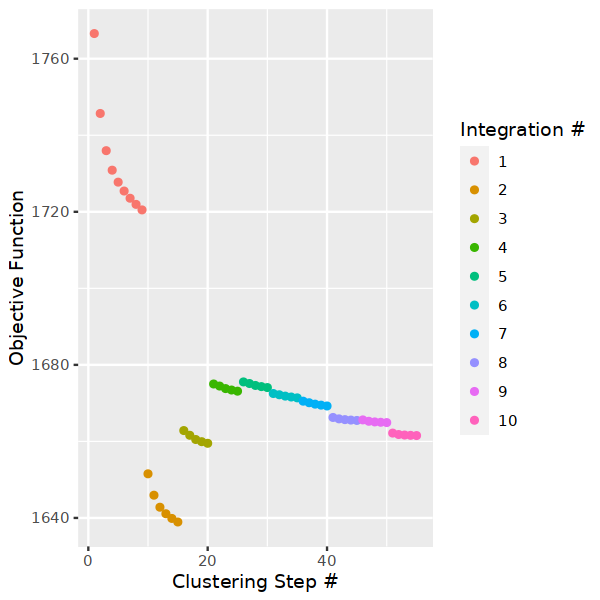

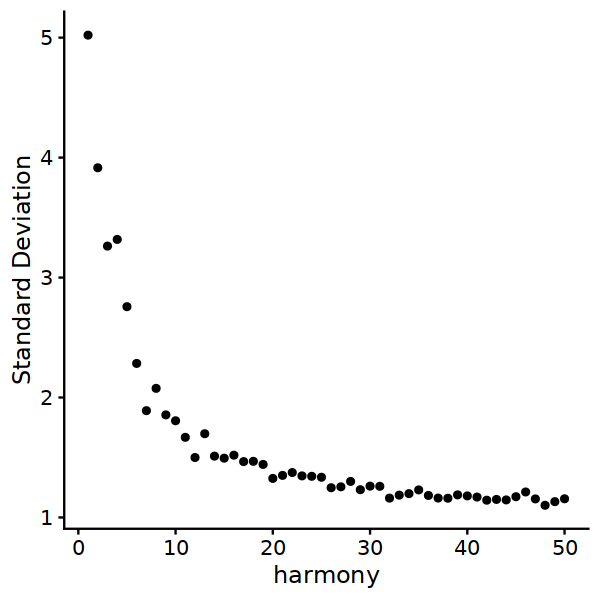

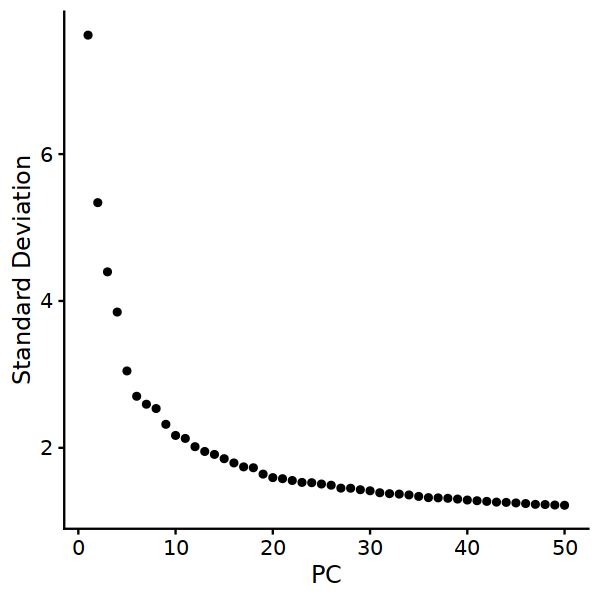

In [80]:
fig.size(5,5)
synRNA.T4 <- RunHarmony(synRNA.T4, group.by.vars=c("orig.ident", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = F)

ElbowPlot(synRNA.T4, ndims = 50, reduction = "harmony") 
ElbowPlot(synRNA.T4, ndims = 50, reduction = "pca") 

In [81]:
synRNA.T4 <- NormalizeData(synRNA.T4, assay = "ADT", normalization.method = "CLR", margin = 2) %>% 
                ScaleData(assay = "ADT")

Normalizing across cells

Centering and scaling data matrix



In [82]:
set.seed(1)
HU <- uwot::umap(synRNA.T4@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(synRNA.T4)
synRNA.T4[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(synRNA.T4)
synRNA.T4[['humap_fgraph']] <- HU_graph

synRNA.T4 <- FindClusters(synRNA.T4, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 33041
Number of edges: 412202

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7518
Number of communities: 17
Elapsed time: 10 seconds


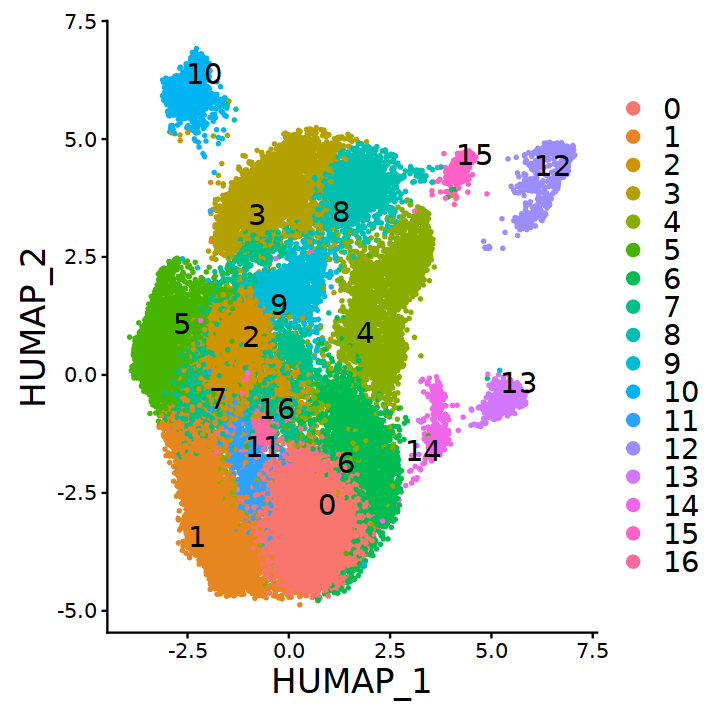

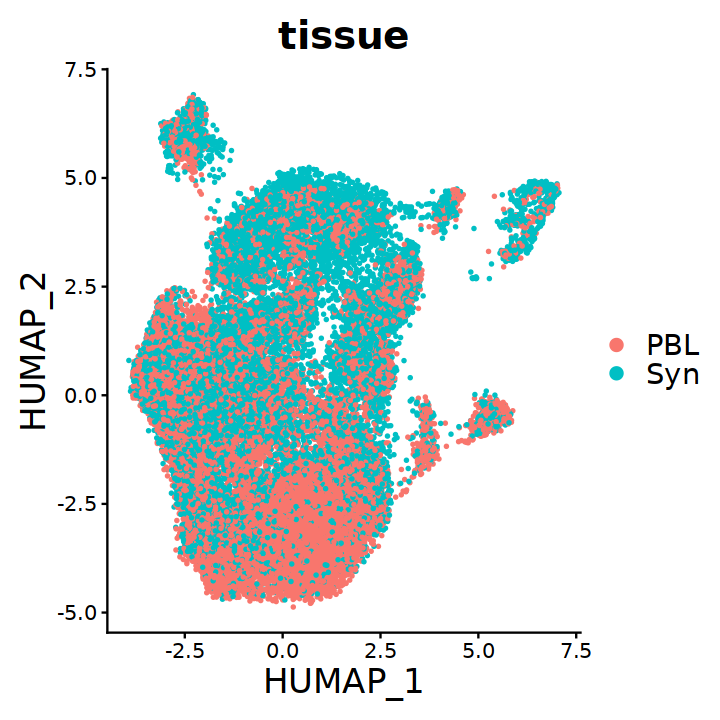

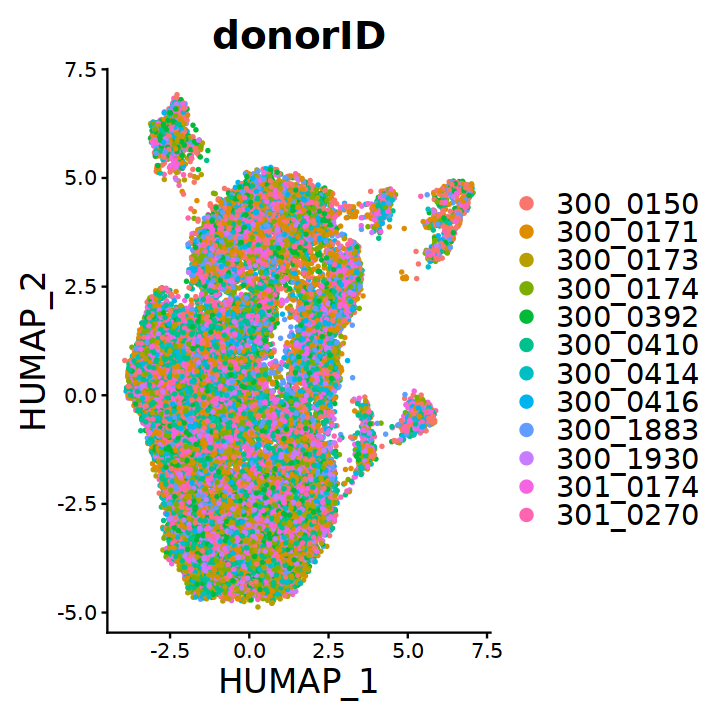

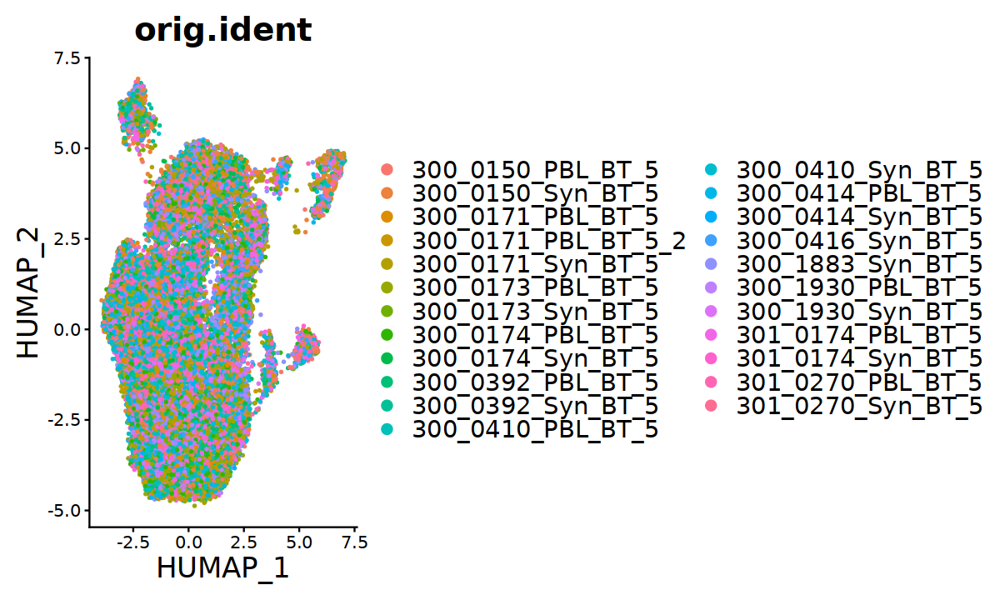

In [83]:
Clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:8], 
                 colorRampPalette(brewer.pal(8, "Set1"))(13)[1:8], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:8])

fig.size(6, 6)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

DimPlot(synRNA.T4, label = T, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(synRNA.T4, group.by = "tissue", label = F, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(synRNA.T4, group.by = "donorID", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
fig.size(6, 10)
DimPlot(synRNA.T4, group.by = "orig.ident", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))




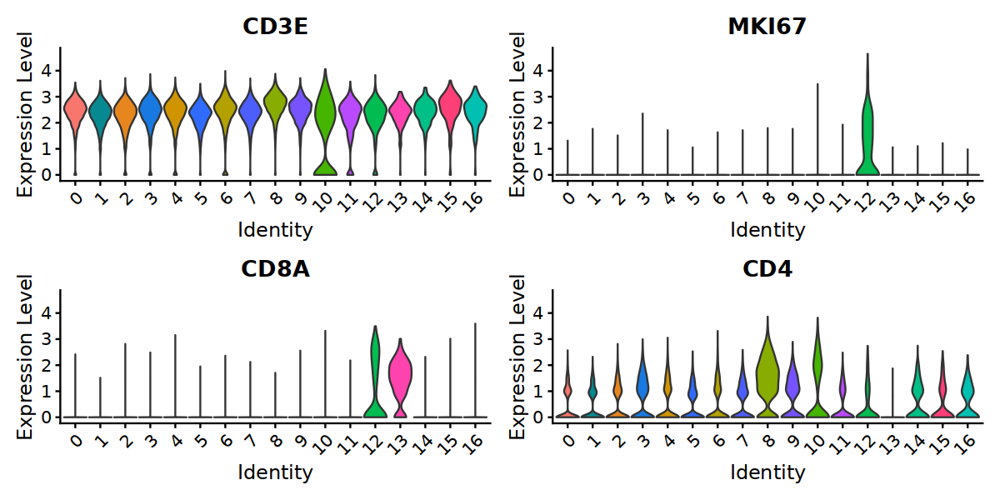

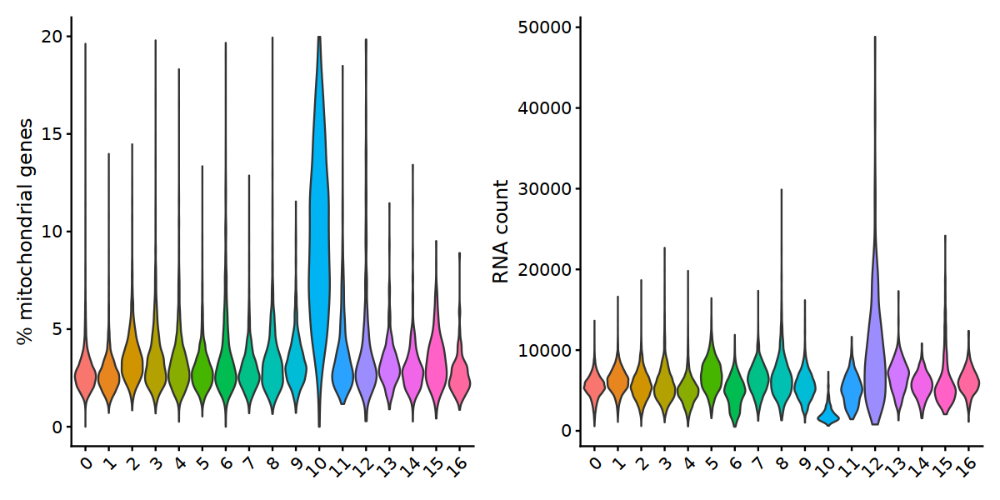

In [85]:
fig.size(5, 10)
VlnPlot(object = synRNA.T4, features = c('CD3E', 'MKI67','CD8A', 'CD4'),
        split.by = 'seurat_clusters', ncol = 2, same.y.lims = T, pt.size = 0)


synRNA[["percent.mito"]] <- PercentageFeatureSet(synRNA.T4, pattern = "^MT-")
a <- VlnPlot(synRNA.T4, features = "percent.mito", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("% mitochondrial genes")
b <- VlnPlot(synRNA.T4, features = "nCount_RNA", pt.size = 0.0) + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("RNA count")
a|b

### refine CD4 T

In [89]:
synRNA.T4 <- subset(synRNA.T4, idents = c(13), invert = T) 

In [90]:
#Redo normalization and clustering
synRNA.T4 <- NormalizeData(synRNA.T4, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
            FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
            ScaleData() %>% 
            RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



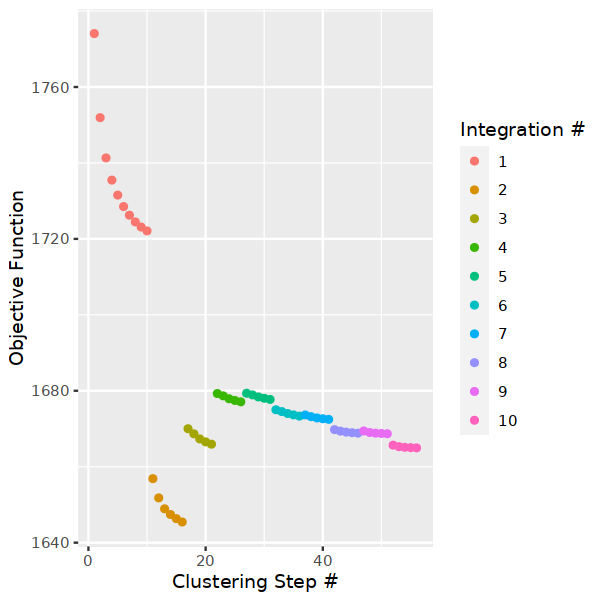

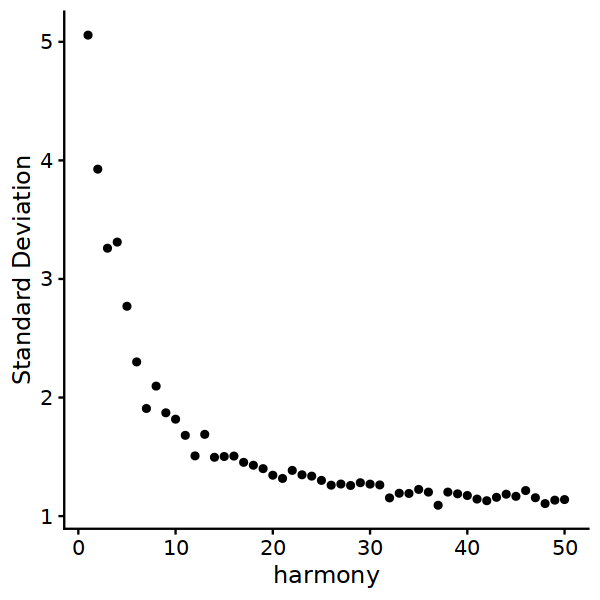

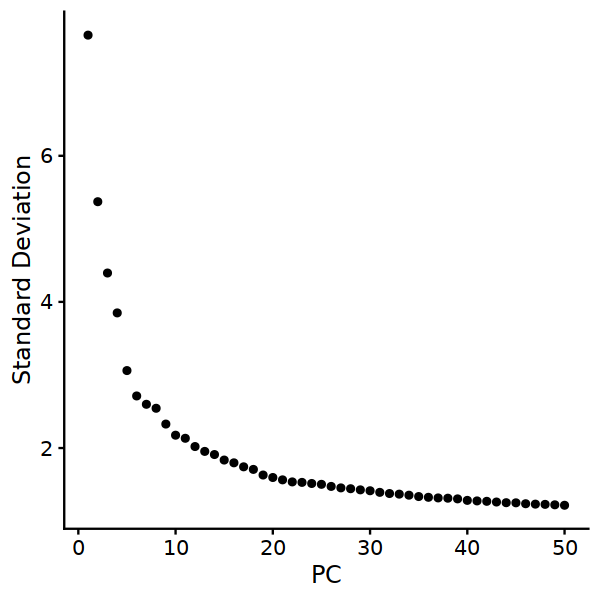

In [91]:
fig.size(5,5)
synRNA.T4 <- RunHarmony(synRNA.T4, group.by.vars=c("orig.ident", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = F)

ElbowPlot(synRNA.T4, ndims = 50, reduction = "harmony") 
ElbowPlot(synRNA.T4, ndims = 50, reduction = "pca") 

In [92]:
set.seed(1)
HU <- uwot::umap(synRNA.T4@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(synRNA.T4)
synRNA.T4[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(synRNA.T4)
synRNA.T4[['humap_fgraph']] <- HU_graph

synRNA.T4 <- FindClusters(synRNA.T4, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 32539
Number of edges: 406259

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7474
Number of communities: 16
Elapsed time: 2 seconds


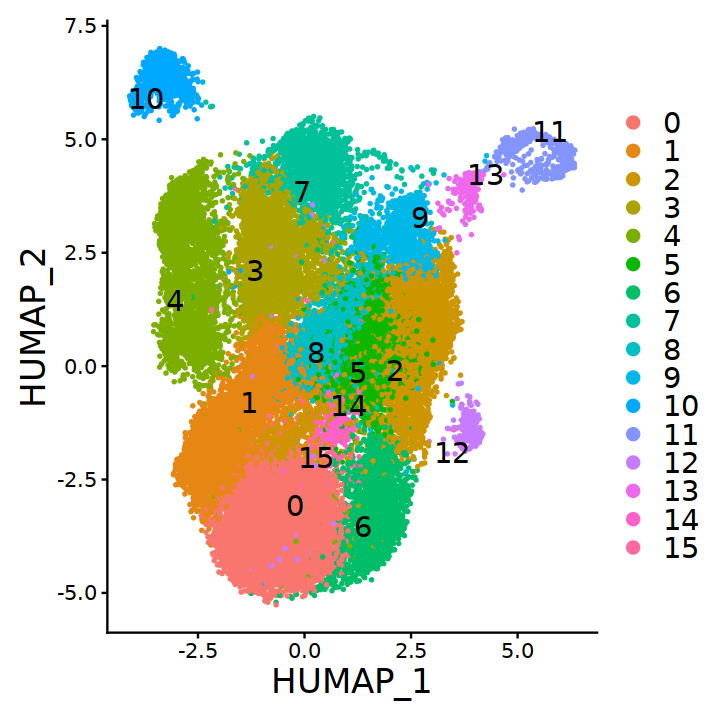

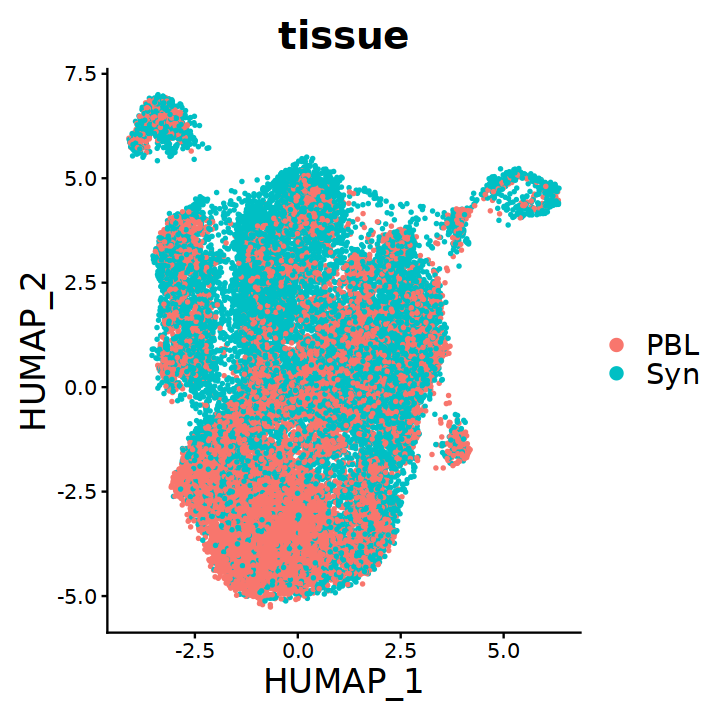

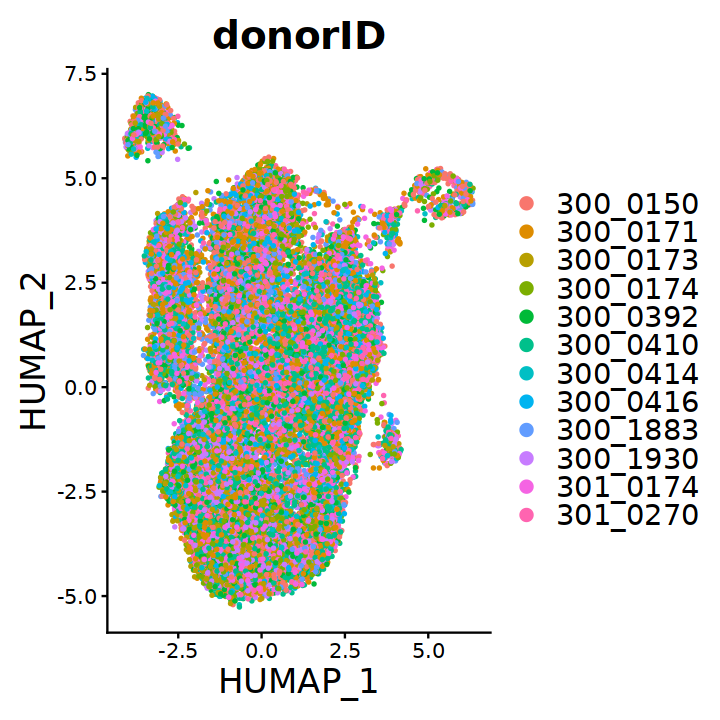

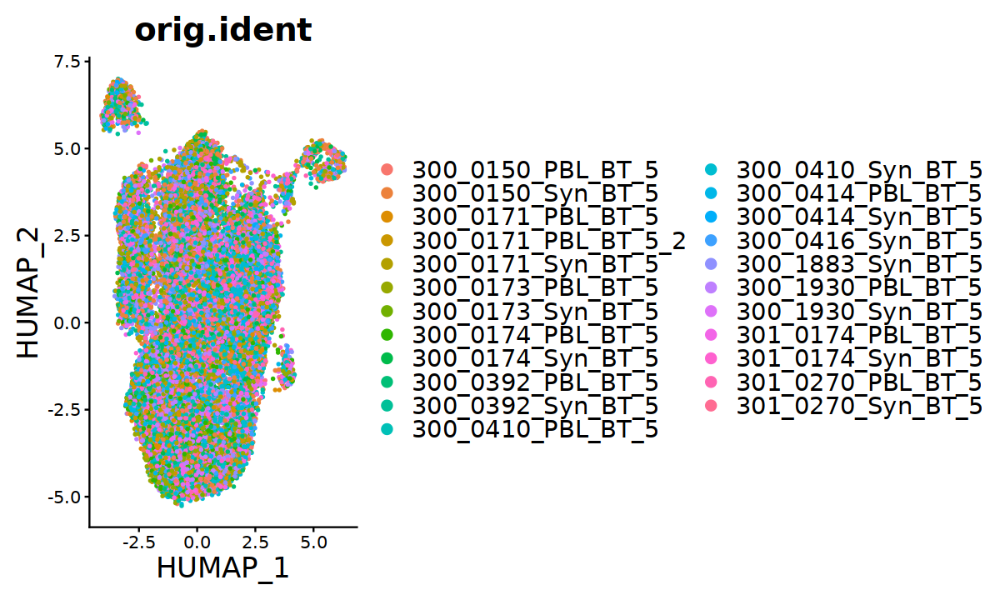

In [93]:
Clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:8], 
                 colorRampPalette(brewer.pal(8, "Set1"))(13)[1:8], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:8])

fig.size(6, 6)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

DimPlot(synRNA.T4, label = T, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(synRNA.T4, group.by = "tissue", label = F, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(synRNA.T4, group.by = "donorID", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
fig.size(6, 10)
DimPlot(synRNA.T4, group.by = "orig.ident", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))



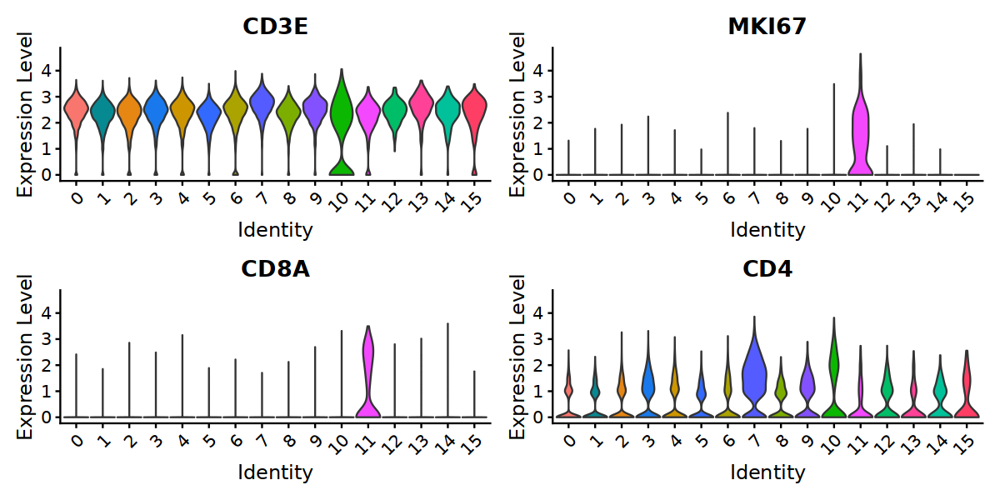

In [94]:
fig.size(5, 10)
VlnPlot(object = synRNA.T4, features = c('CD3E', 'MKI67','CD8A', 'CD4'),
        split.by = 'seurat_clusters', ncol = 2, same.y.lims = T, pt.size = 0)


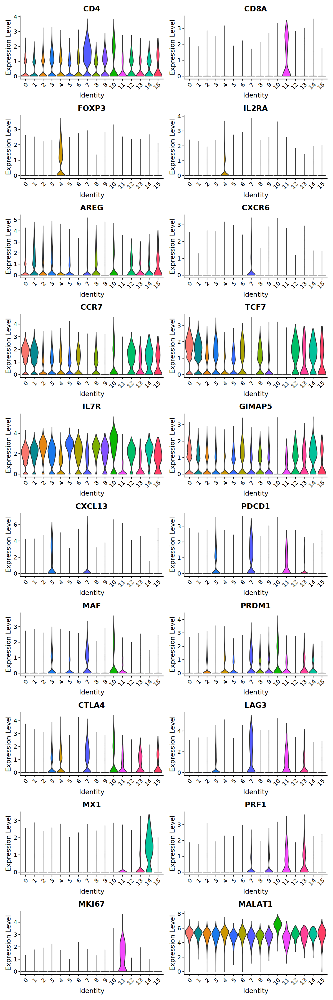

In [117]:
options(repr.plot.width=10, repr.plot.height=30)
VlnPlot(object = synRNA.T4, features = c('CD4', 'CD8A',
                                     'FOXP3', 'IL2RA',
                                     'AREG', 'CXCR6',
                                     'CCR7','TCF7',
                                     'IL7R', 'GIMAP5',
                                     'CXCL13', 'PDCD1',
                                     'MAF', 'PRDM1',
                                     'CTLA4', 'LAG3',
                                     'MX1', 'PRF1',
                                     'MKI67', 'MALAT1'),
        split.by = 'seurat_clusters', ncol = 2, same.y.lims = F, pt.size = 0)

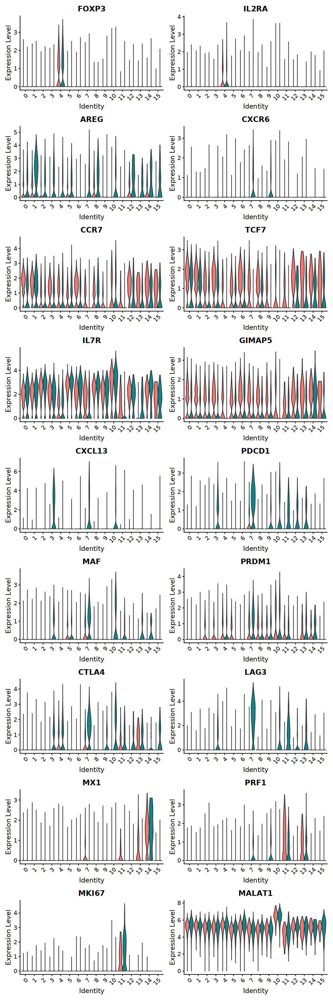

In [119]:
options(repr.plot.width=10, repr.plot.height=30)
VlnPlot(object = synRNA.T4, features = c('FOXP3', 'IL2RA',
                                     'AREG', 'CXCR6',
                                     'CCR7','TCF7',
                                     'IL7R', 'GIMAP5',
                                     'CXCL13', 'PDCD1',
                                     'MAF', 'PRDM1',
                                     'CTLA4', 'LAG3',
                                     'MX1', 'PRF1',
                                     'MKI67', 'MALAT1'),
        split.by ="tissue", ncol = 2, same.y.lims = F, pt.size = 0, group.by = "seurat_clusters")

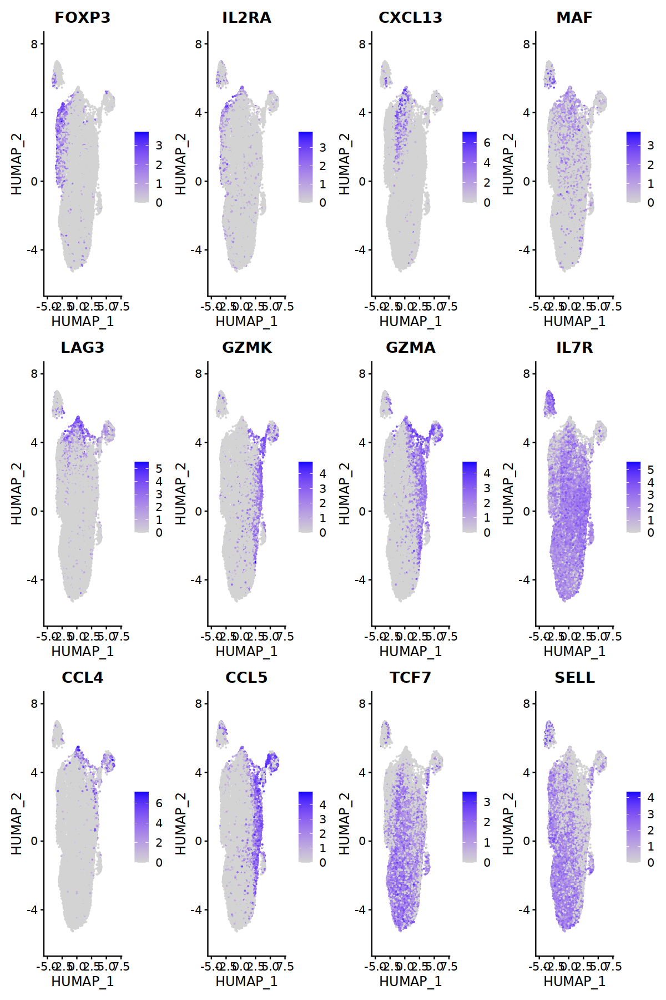

In [128]:
fig.size(15,10)
FeaturePlot(synRNA.T4, c("FOXP3", "IL2RA", "CXCL13", "MAF", "LAG3","GZMK", "GZMA", "IL7R", "CCL4", "CCL5", "TCF7", "SELL"))

In [107]:
saveRDS(synRNA.T4, paste0(save_path, "/AMPrep.all.CD4T.rds"))

## Extract Tregs only

In [108]:
# Treg and poroliferating
Tregs <- subset(synRNA.T4, idents = c(4, 11))

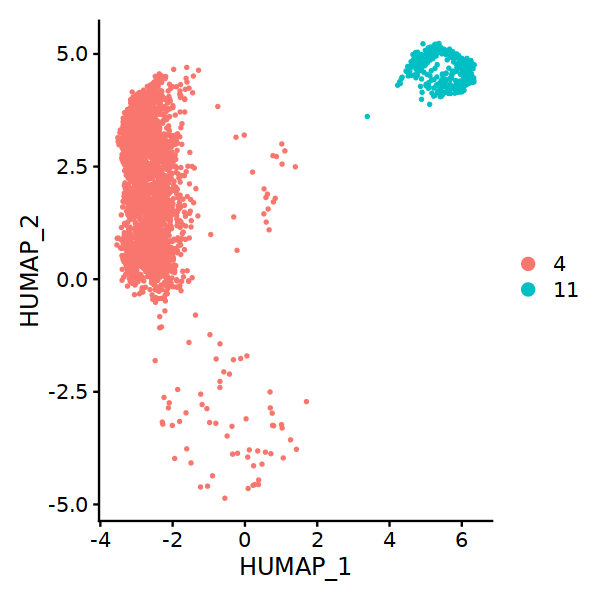

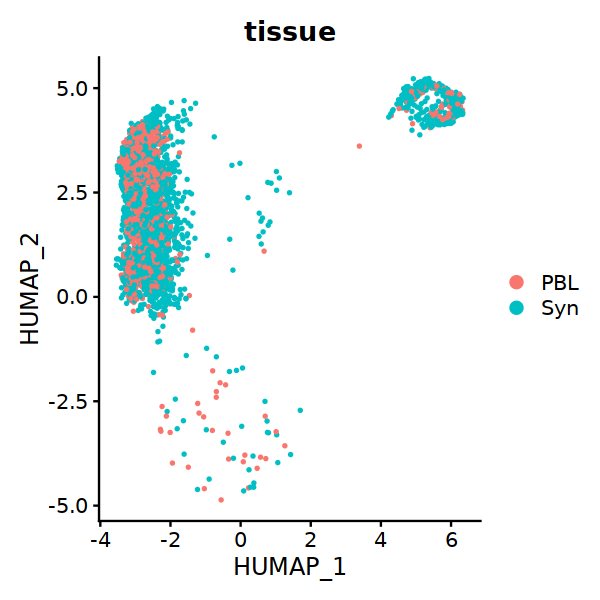

In [109]:
fig.size(5,5)
DimPlot(Tregs)
DimPlot(Tregs, group.by = "tissue")

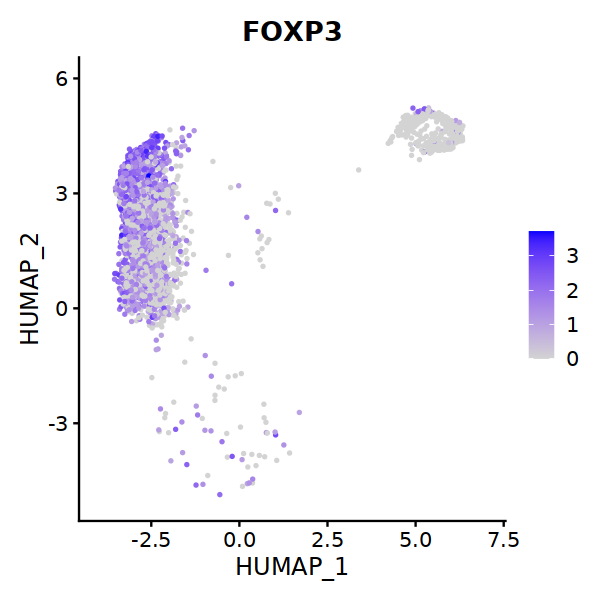

In [110]:
FeaturePlot(Tregs, features = "FOXP3")

In [118]:
Tregs

An object of class Seurat 
36607 features across 3298 samples within 2 assays 
Active assay: RNA (36601 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, harmony, humap

### Normalization, harmony, clustering - Tregs

In [111]:
Tregs <- DietSeurat(Tregs, scale.data = FALSE, dimreducs = NULL)
Tregs$`humap_fgraph_res.1` <- NULL
Tregs$seurat_clusters <- NULL

In [112]:
#Redo normalization and clustering
Tregs <- NormalizeData(Tregs, normalization.method = "LogNormalize", scale.factor = 10000) %>% 
        FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
        ScaleData() %>% 
        RunPCA(verbose = F)

Centering and scaling data matrix



In [113]:
Tregs <- NormalizeData(Tregs, assay = "ADT", normalization.method = "CLR", margin = 2)%>% 
        ScaleData(assay = "ADT")

Normalizing across cells

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations



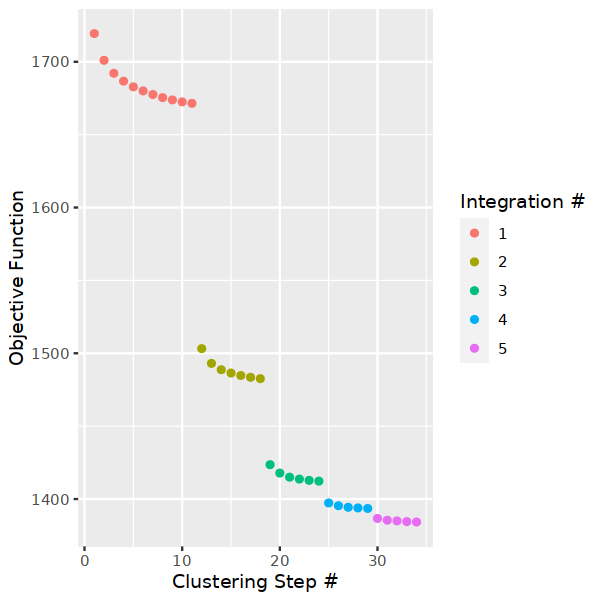

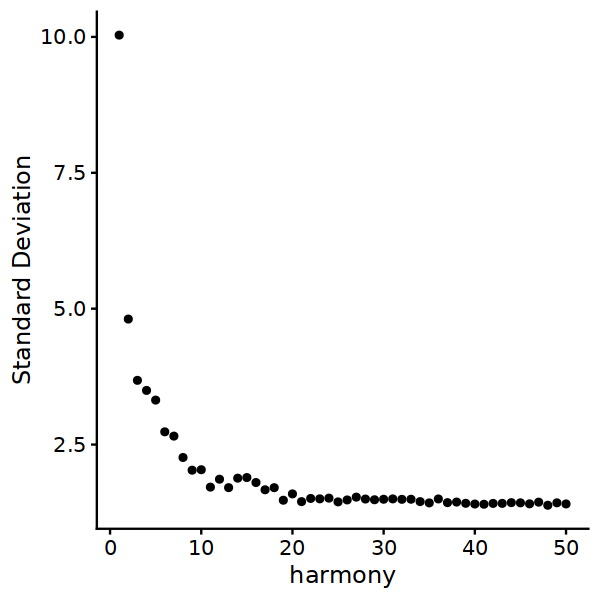

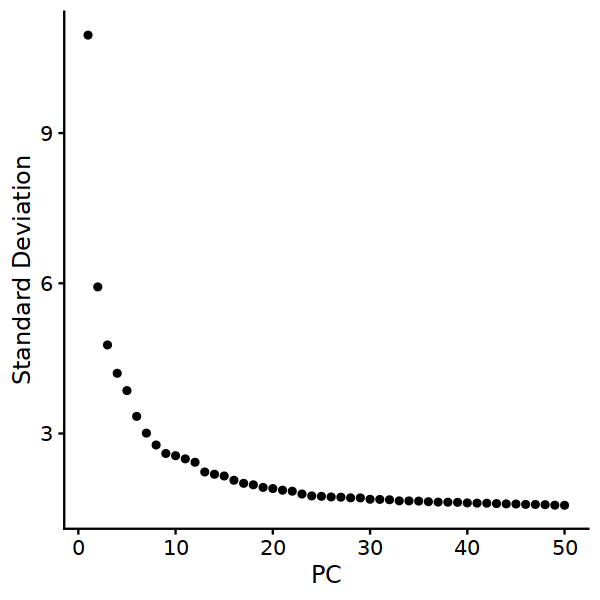

In [114]:
fig.size(5,5)
Tregs <- RunHarmony(Tregs, group.by.vars=c("orig.ident", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

ElbowPlot(Tregs, ndims = 50, reduction = "harmony") 
ElbowPlot(Tregs, ndims = 50, reduction = "pca") 

In [123]:
set.seed(1)
HU <- uwot::umap(Tregs@reductions$harmony@cell.embeddings, min_dist = 0.3, 
                 spread = 0.8, ret_extra = 'fgraph', fast_sgd = FALSE)
colnames(HU$embedding) = c('HUMAP1', 'HUMAP2')
rownames(HU$fgraph) = colnames(HU$fgraph) = Cells(Tregs)
Tregs[['humap']] <- Seurat::CreateDimReducObject(
    embeddings = HU$embedding,
    assay = 'RNA',
    key = 'HUMAP_',
    global = TRUE
)
HU_graph <- Seurat::as.Graph(HU$fgraph)
DefaultAssay(HU_graph) <- DefaultAssay(Tregs)
Tregs[['humap_fgraph']] <- HU_graph

Tregs <- FindClusters(Tregs, graph.name = 'humap_fgraph', resolution = 0.8, verbose = TRUE)


Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3298
Number of edges: 40289

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7072
Number of communities: 7
Elapsed time: 0 seconds


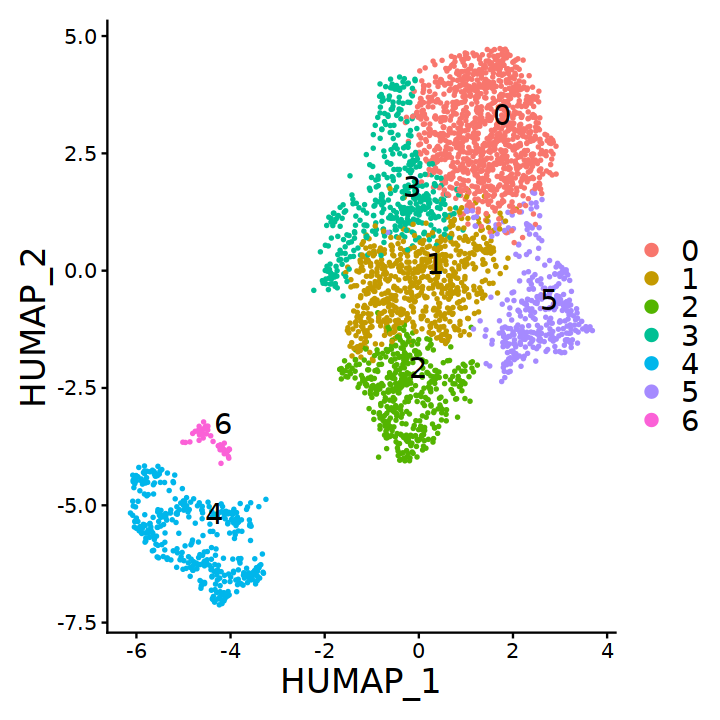

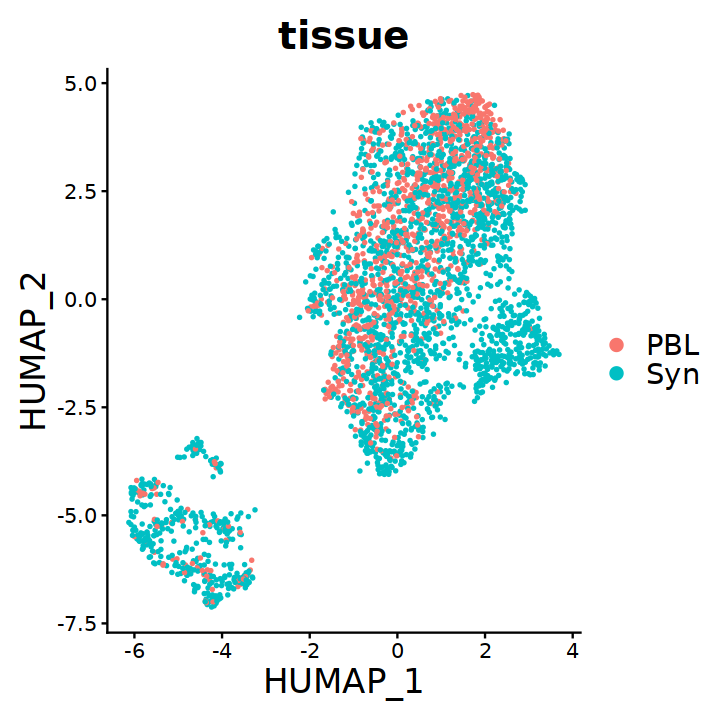

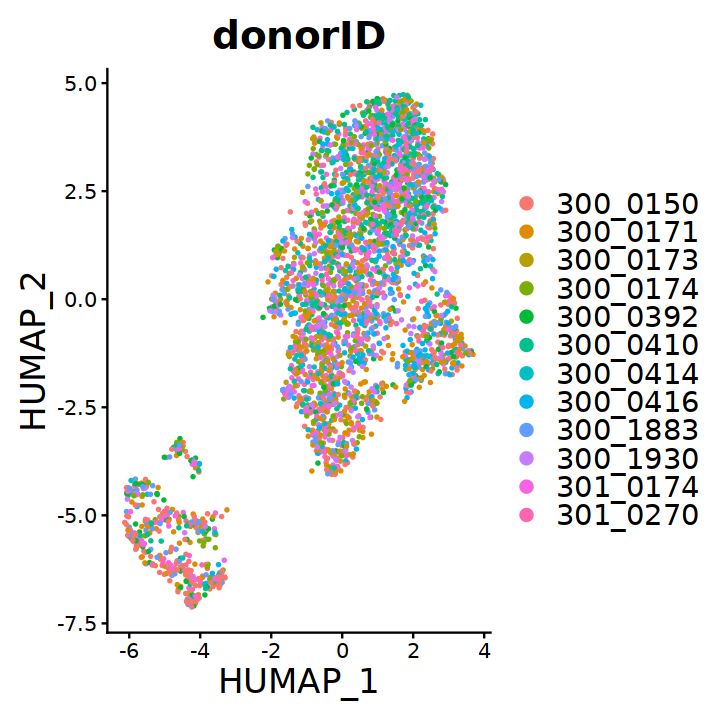

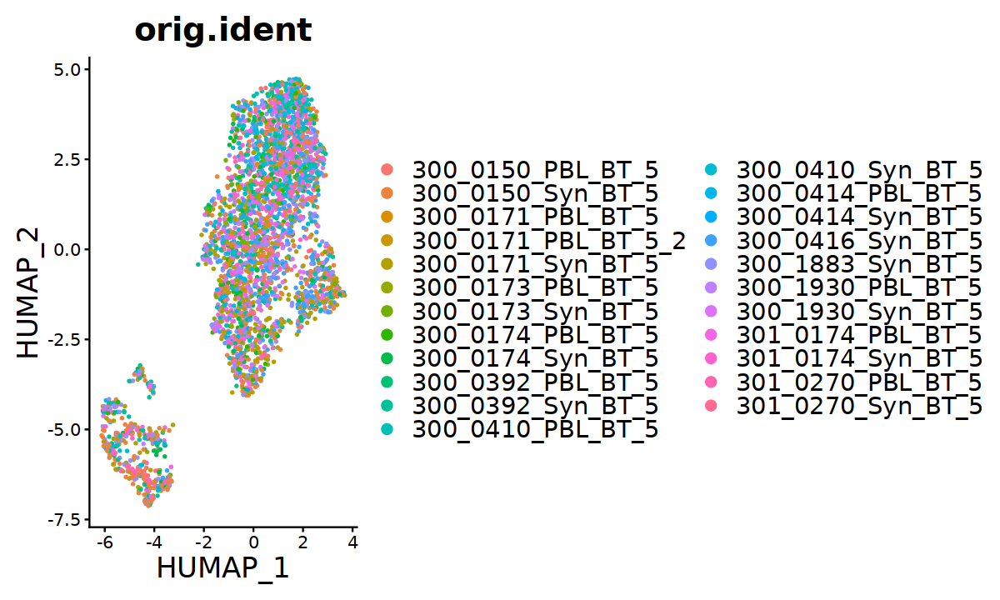

In [124]:
fig.size(6, 6)

# clustercols <- c(colorRampPalette(brewer.pal(8, "Set2"))(13)[1:10], colorRampPalette(brewer.pal(8, "Set1"))(13)[1:9], colorRampPalette(brewer.pal(8, "Set3"))(13)[1:9])

DimPlot(Tregs, label = T, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(Tregs, group.by = "tissue", label = F, repel = T, shuffle = T, pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
DimPlot(Tregs, group.by = "donorID", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))
fig.size(6, 10)
DimPlot(Tregs, group.by = "orig.ident", label = F, repel = T, shuffle = T,pt.size = 0.5, label.size = 6) + theme(text = element_text(size = 20))



In [125]:
clust.markers <- wilcoxauc(Tregs, "seurat_clusters")
options(repr.matrix.max.cols=150, repr.matrix.max.rows=200)
clust.markers %>%
    group_by(group) %>% filter(padj <0.05 & auc > 0.6) %>% 
    slice_max(n = 30, order_by = logFC) %>% 
    select(feature, group) %>% 
    mutate(row = row_number()) %>% 
    tidyr::pivot_wider(names_from = group, values_from = feature)

row,0,1,2,3,4,5,6
<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,CCR7,IL32,CD74,MALAT1,STMN1,DUSP4,MKI67
2,RPS12,S100A4,TNFRSF18,MTRNR2L12,CCL5,GEM,CCL5
3,EEF1B2,CD52,TNFRSF4,MT-ND2,NKG7,ZNF331,CENPF
4,RPL32,LGALS3,FOXP3,LTB,GZMA,CREM,ASPM
5,RPS3A,IL10RA,S100A4,MT-ND3,TUBA1B,SRGN,CCL4
6,RPS13,DNAJB1,CTSC,MT-CYB,TUBB,LMNA,MT-CO1
7,RPL5,TLE5,IL32,MT-ND4,CCL4,DUSP2,MT-CO2
8,SELL,FTH1,TNFRSF1B,MT-ND5,TYMS,CD7,MT-CO3
9,RPS8,EVL,HLA-DRB1,MT-ND1,HMGB2,NR3C1,MT-ATP6


In [121]:
table(Tregs$tissue)


 PBL  Syn 
1088 2210 

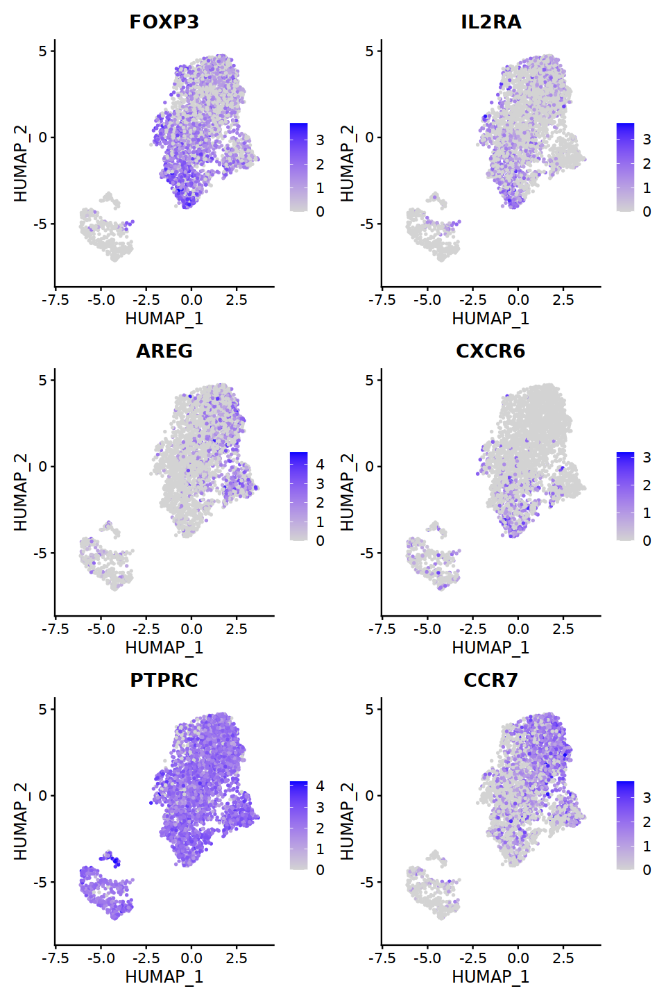

In [122]:
fig.size(12,8)
FeaturePlot(Tregs, features = c('FOXP3', 'IL2RA', 'AREG', 'CXCR6', "PTPRC", "CCR7"), ncol = 2)


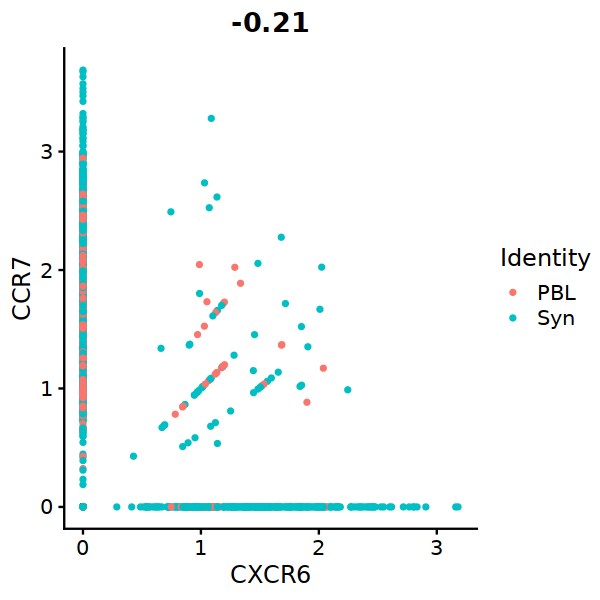

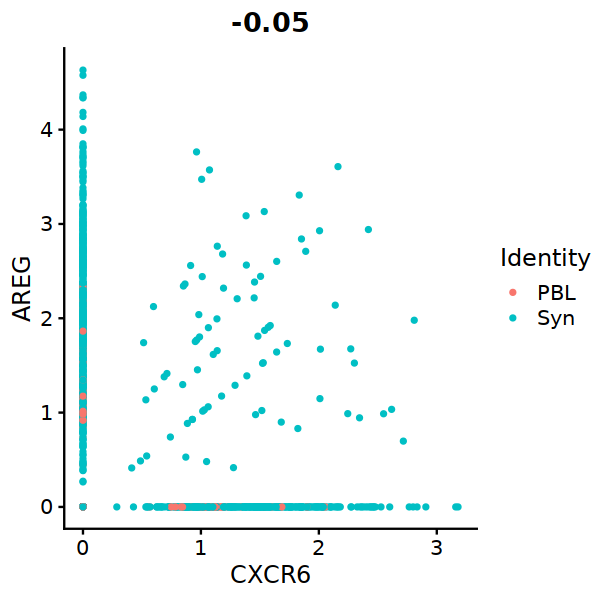

In [126]:
fig.size(5,5)
FeatureScatter(Tregs, feature1 = "CXCR6", feature2 = "CCR7", group.by = "tissue", shuffle = T)
FeatureScatter(Tregs, feature1 = "CXCR6", feature2 = "AREG", group.by = "tissue", shuffle = T)

### Save Tregs

In [127]:
saveRDS(Tregs, paste0(save_path, "AMPrep_ST_BL_filtered_Tregs.rds"))

In [ ]:
table(Tregs$tissue)

In [ ]:
table(Tregs$seurat_clusters, Tregs$tissue)
table(Tregs$seurat_clusters, Tregs$donorID)

In [ ]:
sessionInfo()